## Creating the Multiclass MURA dataset ##

In [ ]:
import pandas as pd

def extract_body_part(path):
    """Extracts the body part from a given path in the dataset."""
    return path.split('/')[2][3:]  # This splits by '/' and takes the substring after 'XR_'

def create_combined_label(row):
    """Creates a combined label from the abnormality status and body part."""
    status = 'Abnormal' if row['abnormality'] == 1 else 'Normal'
    return f'{status}-{row["body_part"]}'

In [ ]:
def load_and_transform_data(filepath):
    """Loads data from a CSV file, transforms it by extracting body parts and creating new labels."""
    # Load the dataset without a header and name the columns
    data = pd.read_csv(filepath, header=None, names=['path', 'abnormality'])

    # Extract body part and create a new label
    data['body_part'] = data['path'].apply(extract_body_part)
    data['label'] = data.apply(create_combined_label, axis=1)

    return data

# File paths
train_labels_path = 'train_labeled_studies.csv'
valid_labels_path = 'valid_labeled_studies.csv'

# Transform datasets
train_data = load_and_transform_data(train_labels_path)
valid_data = load_and_transform_data(valid_labels_path)

In [ ]:
print("Training Data Sample:")
print(train_data.head())

print("\nValidation Data Sample:")
print(valid_data.head())

Training Data Sample:
                                                path  abnormality body_part  \
0  MURA-v1.1/train/XR_SHOULDER/patient00001/study...            1  SHOULDER   
1  MURA-v1.1/train/XR_SHOULDER/patient00002/study...            1  SHOULDER   
2  MURA-v1.1/train/XR_SHOULDER/patient00003/study...            1  SHOULDER   
3  MURA-v1.1/train/XR_SHOULDER/patient00004/study...            1  SHOULDER   
4  MURA-v1.1/train/XR_SHOULDER/patient00005/study...            1  SHOULDER   

               label  
0  Abnormal-SHOULDER  
1  Abnormal-SHOULDER  
2  Abnormal-SHOULDER  
3  Abnormal-SHOULDER  
4  Abnormal-SHOULDER  

Validation Data Sample:
                                                path  abnormality body_part  \
0  MURA-v1.1/valid/XR_WRIST/patient11185/study1_p...            1     WRIST   
1  MURA-v1.1/valid/XR_WRIST/patient11186/study1_p...            1     WRIST   
2  MURA-v1.1/valid/XR_WRIST/patient11186/study2_p...            1     WRIST   
3  MURA-v1.1/valid/XR_WR

In [ ]:
# Save the transformed data back to new CSV files for future use
train_data.to_csv('multiclass_train_data_transformed.csv', index=False)
valid_data.to_csv('multiclass_valid_data_transformed.csv', index=False)

In [ ]:
import os
import shutil
from tqdm import tqdm
import pandas as pd

def extract_details(path):
    parts = path.split('/')
    print(f"Full path: {path}")  # Debugging: Show the full path
    body_part = parts[1][3:]  # Remove 'XR_' prefix
    print(f"Body part extracted: {body_part}")  # Debugging: Show the body part extracted

    # Check if 'positive' or 'negative' is in the study type part of the path
    study_type = parts[3]
    print(f"Study type segment in path: {study_type}")  # Debugging: Show the study type part of the path

    if 'positive' in study_type:
        abnormality = 'Abnormal'
    elif 'negative' in study_type:
        abnormality = 'Normal'
    else:
        raise ValueError(f"Unexpected study type in path: {path}")

    return body_part, abnormality

data = pd.read_csv('valid_image_paths.csv', names=['path'])

# Remove 'MURA-v1.1/' prefix if it exists in the path
data['path'] = data['path'].apply(lambda x: x.replace('MURA-v1.1/', ''))

image_counter = {}  # Keep track of the count of images for each category

def organize_and_rename_images(data, source_root, target_root):
    for _, row in tqdm(data.iterrows(), total=len(data)):
        body_part, abnormality = extract_details(row['path'])
        directory_name = f"{abnormality}-{body_part.upper()}"  # E.g., 'Abnormal-WRIST'
        image_name_prefix = f"{abnormality.lower()}_{body_part.lower()}"  # E.g., 'abnormal_wrist'

        image_counter[directory_name] = image_counter.get(directory_name, 0) + 1

        source_file = os.path.join(source_root, row['path'])
        target_dir = os.path.join(target_root, directory_name)

        new_filename = f"{image_name_prefix}_{image_counter[directory_name]}.png"
        target_file = os.path.join(target_dir, new_filename)

        os.makedirs(target_dir, exist_ok=True)

        shutil.move(source_file, target_file)
        print(f"Moved and renamed: {source_file} to {target_file}")

source_root = '.'  # The current directory
target_root = 'multiclass_valid'

organize_and_rename_images(data, source_root, target_root)

  1%|          | 17/3197 [00:00<00:19, 165.39it/s]

Full path: valid/XR_WRIST/patient11185/study1_positive/image1.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11185/study1_positive/image1.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_1.png
Full path: valid/XR_WRIST/patient11185/study1_positive/image2.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11185/study1_positive/image2.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_2.png
Full path: valid/XR_WRIST/patient11185/study1_positive/image3.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11185/study1_positive/image3.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_3.png
Full path: valid/XR_WRIST/patient11185/study1_positive/image4.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11185/study1_

  2%|▏         | 58/3197 [00:00<00:16, 189.25it/s]

Moved and renamed: ./valid/XR_WRIST/patient11195/study1_positive/image3.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_37.png
Full path: valid/XR_WRIST/patient11196/study1_positive/image1.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11196/study1_positive/image1.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_38.png
Full path: valid/XR_WRIST/patient11196/study1_positive/image2.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11196/study1_positive/image2.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_39.png
Full path: valid/XR_WRIST/patient11196/study1_positive/image3.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11196/study1_positive/image3.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_40.png
Full path: valid/XR_WRIST/patient11196/study1_positive/im

  3%|▎         | 101/3197 [00:00<00:15, 200.68it/s]

Moved and renamed: ./valid/XR_WRIST/patient11209/study1_positive/image3.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_77.png
Full path: valid/XR_WRIST/patient11210/study1_positive/image1.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11210/study1_positive/image1.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_78.png
Full path: valid/XR_WRIST/patient11210/study1_positive/image2.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11210/study1_positive/image2.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_79.png
Full path: valid/XR_WRIST/patient11210/study1_positive/image3.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11210/study1_positive/image3.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_80.png
Full path: valid/XR_WRIST/patient11211/study1_positive/im

  5%|▍         | 144/3197 [00:00<00:15, 200.76it/s]

Moved and renamed: ./valid/XR_WRIST/patient11220/study1_positive/image2.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_113.png
Full path: valid/XR_WRIST/patient11220/study1_positive/image3.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11220/study1_positive/image3.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_114.png
Full path: valid/XR_WRIST/patient11221/study1_positive/image1.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11221/study1_positive/image1.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_115.png
Full path: valid/XR_WRIST/patient11221/study1_positive/image2.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11221/study1_positive/image2.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_116.png
Full path: valid/XR_WRIST/patient11221/study1_positiv

  6%|▌         | 186/3197 [00:00<00:15, 197.19it/s]

Moved and renamed: ./valid/XR_WRIST/patient11230/study1_positive/image2.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_143.png
Full path: valid/XR_WRIST/patient11230/study1_positive/image3.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11230/study1_positive/image3.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_144.png
Full path: valid/XR_WRIST/patient11230/study2_negative/image1.png
Body part extracted: WRIST
Study type segment in path: study2_negative
Moved and renamed: ./valid/XR_WRIST/patient11230/study2_negative/image1.png to multiclass_valid/Normal-WRIST/normal_wrist_20.png
Full path: valid/XR_WRIST/patient11231/study1_positive/image1.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11231/study1_positive/image1.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_145.png
Full path: valid/XR_WRIST/patient11231/study1_positive/ima

  7%|▋         | 226/3197 [00:01<00:15, 189.90it/s]

Moved and renamed: ./valid/XR_WRIST/patient11239/study2_negative/image3.png to multiclass_valid/Normal-WRIST/normal_wrist_26.png
Full path: valid/XR_WRIST/patient11240/study1_positive/image1.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11240/study1_positive/image1.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_176.png
Full path: valid/XR_WRIST/patient11240/study1_positive/image2.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11240/study1_positive/image2.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_177.png
Full path: valid/XR_WRIST/patient11240/study1_positive/image3.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11240/study1_positive/image3.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_178.png
Full path: valid/XR_WRIST/patient11241/study1_positive/ima

  8%|▊         | 266/3197 [00:01<00:15, 185.37it/s]

Moved and renamed: ./valid/XR_WRIST/patient11251/study1_positive/image1.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_212.png
Full path: valid/XR_WRIST/patient11251/study1_positive/image2.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11251/study1_positive/image2.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_213.png
Full path: valid/XR_WRIST/patient11251/study1_positive/image3.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11251/study1_positive/image3.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_214.png
Full path: valid/XR_WRIST/patient11252/study1_positive/image1.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11252/study1_positive/image1.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_215.png
Full path: valid/XR_WRIST/patient11252/study1_positiv

 10%|▉         | 307/3197 [00:01<00:15, 192.01it/s]

Moved and renamed: ./valid/XR_WRIST/patient11262/study1_positive/image2.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_247.png
Full path: valid/XR_WRIST/patient11262/study1_positive/image3.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11262/study1_positive/image3.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_248.png
Full path: valid/XR_WRIST/patient11263/study1_positive/image1.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11263/study1_positive/image1.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_249.png
Full path: valid/XR_WRIST/patient11263/study1_positive/image2.png
Body part extracted: WRIST
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_WRIST/patient11263/study1_positive/image2.png to multiclass_valid/Abnormal-WRIST/abnormal_wrist_250.png
Full path: valid/XR_WRIST/patient11263/study1_positiv

 11%|█         | 347/3197 [00:01<00:14, 193.60it/s]

Moved and renamed: ./valid/XR_WRIST/patient11272/study3_negative/image1.png to multiclass_valid/Normal-WRIST/normal_wrist_37.png
Full path: valid/XR_WRIST/patient11272/study3_negative/image2.png
Body part extracted: WRIST
Study type segment in path: study3_negative
Moved and renamed: ./valid/XR_WRIST/patient11272/study3_negative/image2.png to multiclass_valid/Normal-WRIST/normal_wrist_38.png
Full path: valid/XR_WRIST/patient11272/study3_negative/image3.png
Body part extracted: WRIST
Study type segment in path: study3_negative
Moved and renamed: ./valid/XR_WRIST/patient11272/study3_negative/image3.png to multiclass_valid/Normal-WRIST/normal_wrist_39.png
Full path: valid/XR_WRIST/patient11272/study4_negative/image1.png
Body part extracted: WRIST
Study type segment in path: study4_negative
Moved and renamed: ./valid/XR_WRIST/patient11272/study4_negative/image1.png to multiclass_valid/Normal-WRIST/normal_wrist_40.png
Full path: valid/XR_WRIST/patient11272/study4_negative/image2.png
Body pa

 12%|█▏        | 387/3197 [00:02<00:15, 183.22it/s]

Moved and renamed: ./valid/XR_WRIST/patient11283/study1_negative/image2.png to multiclass_valid/Normal-WRIST/normal_wrist_59.png
Full path: valid/XR_WRIST/patient11283/study2_negative/image1.png
Body part extracted: WRIST
Study type segment in path: study2_negative
Moved and renamed: ./valid/XR_WRIST/patient11283/study2_negative/image1.png to multiclass_valid/Normal-WRIST/normal_wrist_60.png
Full path: valid/XR_WRIST/patient11284/study1_negative/image1.png
Body part extracted: WRIST
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_WRIST/patient11284/study1_negative/image1.png to multiclass_valid/Normal-WRIST/normal_wrist_61.png
Full path: valid/XR_WRIST/patient11284/study1_negative/image2.png
Body part extracted: WRIST
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_WRIST/patient11284/study1_negative/image2.png to multiclass_valid/Normal-WRIST/normal_wrist_62.png
Full path: valid/XR_WRIST/patient11285/study1_negative/image1.png
Body pa

 13%|█▎        | 425/3197 [00:02<00:15, 181.73it/s]

Moved and renamed: ./valid/XR_WRIST/patient11300/study1_negative/image2.png to multiclass_valid/Normal-WRIST/normal_wrist_94.png
Full path: valid/XR_WRIST/patient11301/study1_negative/image1.png
Body part extracted: WRIST
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_WRIST/patient11301/study1_negative/image1.png to multiclass_valid/Normal-WRIST/normal_wrist_95.png
Full path: valid/XR_WRIST/patient11301/study1_negative/image2.png
Body part extracted: WRIST
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_WRIST/patient11301/study1_negative/image2.png to multiclass_valid/Normal-WRIST/normal_wrist_96.png
Full path: valid/XR_WRIST/patient11302/study1_negative/image1.png
Body part extracted: WRIST
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_WRIST/patient11302/study1_negative/image1.png to multiclass_valid/Normal-WRIST/normal_wrist_97.png
Full path: valid/XR_WRIST/patient11303/study1_negative/image1.png
Body pa

 15%|█▍        | 467/3197 [00:02<00:14, 193.58it/s]

Moved and renamed: ./valid/XR_WRIST/patient11317/study1_negative/image1.png to multiclass_valid/Normal-WRIST/normal_wrist_131.png
Full path: valid/XR_WRIST/patient11317/study2_negative/image1.png
Body part extracted: WRIST
Study type segment in path: study2_negative
Moved and renamed: ./valid/XR_WRIST/patient11317/study2_negative/image1.png to multiclass_valid/Normal-WRIST/normal_wrist_132.png
Full path: valid/XR_WRIST/patient11317/study2_negative/image2.png
Body part extracted: WRIST
Study type segment in path: study2_negative
Moved and renamed: ./valid/XR_WRIST/patient11317/study2_negative/image2.png to multiclass_valid/Normal-WRIST/normal_wrist_133.png
Full path: valid/XR_WRIST/patient11317/study2_negative/image3.png
Body part extracted: WRIST
Study type segment in path: study2_negative
Moved and renamed: ./valid/XR_WRIST/patient11317/study2_negative/image3.png to multiclass_valid/Normal-WRIST/normal_wrist_134.png
Full path: valid/XR_WRIST/patient11318/study1_negative/image1.png
Bod

 16%|█▌        | 509/3197 [00:02<00:13, 199.68it/s]

Moved and renamed: ./valid/XR_WRIST/patient11330/study1_negative/image3.png to multiclass_valid/Normal-WRIST/normal_wrist_173.png
Full path: valid/XR_WRIST/patient11330/study2_negative/image1.png
Body part extracted: WRIST
Study type segment in path: study2_negative
Moved and renamed: ./valid/XR_WRIST/patient11330/study2_negative/image1.png to multiclass_valid/Normal-WRIST/normal_wrist_174.png
Full path: valid/XR_WRIST/patient11330/study2_negative/image2.png
Body part extracted: WRIST
Study type segment in path: study2_negative
Moved and renamed: ./valid/XR_WRIST/patient11330/study2_negative/image2.png to multiclass_valid/Normal-WRIST/normal_wrist_175.png
Full path: valid/XR_WRIST/patient11330/study2_negative/image3.png
Body part extracted: WRIST
Study type segment in path: study2_negative
Moved and renamed: ./valid/XR_WRIST/patient11330/study2_negative/image3.png to multiclass_valid/Normal-WRIST/normal_wrist_176.png
Full path: valid/XR_WRIST/patient11331/study1_negative/image1.png
Bod

 17%|█▋        | 530/3197 [00:02<00:13, 197.15it/s]

Moved and renamed: ./valid/XR_WRIST/patient11342/study1_negative/image3.png to multiclass_valid/Normal-WRIST/normal_wrist_215.png
Full path: valid/XR_WRIST/patient11343/study1_negative/image1.png
Body part extracted: WRIST
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_WRIST/patient11343/study1_negative/image1.png to multiclass_valid/Normal-WRIST/normal_wrist_216.png
Full path: valid/XR_WRIST/patient11343/study1_negative/image2.png
Body part extracted: WRIST
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_WRIST/patient11343/study1_negative/image2.png to multiclass_valid/Normal-WRIST/normal_wrist_217.png
Full path: valid/XR_WRIST/patient11343/study1_negative/image3.png
Body part extracted: WRIST
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_WRIST/patient11343/study1_negative/image3.png to multiclass_valid/Normal-WRIST/normal_wrist_218.png
Full path: valid/XR_WRIST/patient11344/study1_negative/image1.png
Bod

 18%|█▊        | 570/3197 [00:02<00:13, 193.66it/s]

Moved and renamed: ./valid/XR_WRIST/patient11354/study1_negative/image3.png to multiclass_valid/Normal-WRIST/normal_wrist_254.png
Full path: valid/XR_WRIST/patient11355/study1_negative/image1.png
Body part extracted: WRIST
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_WRIST/patient11355/study1_negative/image1.png to multiclass_valid/Normal-WRIST/normal_wrist_255.png
Full path: valid/XR_WRIST/patient11355/study1_negative/image2.png
Body part extracted: WRIST
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_WRIST/patient11355/study1_negative/image2.png to multiclass_valid/Normal-WRIST/normal_wrist_256.png
Full path: valid/XR_WRIST/patient11355/study1_negative/image3.png
Body part extracted: WRIST
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_WRIST/patient11355/study1_negative/image3.png to multiclass_valid/Normal-WRIST/normal_wrist_257.png
Full path: valid/XR_WRIST/patient11356/study1_negative/image1.png
Bod

 19%|█▉        | 611/3197 [00:03<00:13, 197.07it/s]

Moved and renamed: ./valid/XR_WRIST/patient11369/study1_negative/image1.png to multiclass_valid/Normal-WRIST/normal_wrist_295.png
Full path: valid/XR_WRIST/patient11369/study1_negative/image2.png
Body part extracted: WRIST
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_WRIST/patient11369/study1_negative/image2.png to multiclass_valid/Normal-WRIST/normal_wrist_296.png
Full path: valid/XR_WRIST/patient11369/study1_negative/image3.png
Body part extracted: WRIST
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_WRIST/patient11369/study1_negative/image3.png to multiclass_valid/Normal-WRIST/normal_wrist_297.png
Full path: valid/XR_WRIST/patient11370/study1_negative/image1.png
Body part extracted: WRIST
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_WRIST/patient11370/study1_negative/image1.png to multiclass_valid/Normal-WRIST/normal_wrist_298.png
Full path: valid/XR_WRIST/patient11370/study1_negative/image2.png
Bod

 20%|██        | 653/3197 [00:03<00:12, 200.20it/s]

Moved and renamed: ./valid/XR_WRIST/patient11382/study1_negative/image3.png to multiclass_valid/Normal-WRIST/normal_wrist_336.png
Full path: valid/XR_WRIST/patient11383/study1_negative/image1.png
Body part extracted: WRIST
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_WRIST/patient11383/study1_negative/image1.png to multiclass_valid/Normal-WRIST/normal_wrist_337.png
Full path: valid/XR_WRIST/patient11383/study1_negative/image2.png
Body part extracted: WRIST
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_WRIST/patient11383/study1_negative/image2.png to multiclass_valid/Normal-WRIST/normal_wrist_338.png
Full path: valid/XR_WRIST/patient11383/study1_negative/image3.png
Body part extracted: WRIST
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_WRIST/patient11383/study1_negative/image3.png to multiclass_valid/Normal-WRIST/normal_wrist_339.png
Full path: valid/XR_WRIST/patient11384/study1_negative/image1.png
Bod

 22%|██▏       | 695/3197 [00:03<00:12, 201.75it/s]

Moved and renamed: ./valid/XR_FOREARM/patient11398/study1_positive/image1.png to multiclass_valid/Abnormal-FOREARM/abnormal_forearm_14.png
Full path: valid/XR_FOREARM/patient11398/study1_positive/image2.png
Body part extracted: FOREARM
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FOREARM/patient11398/study1_positive/image2.png to multiclass_valid/Abnormal-FOREARM/abnormal_forearm_15.png
Full path: valid/XR_FOREARM/patient11398/study1_positive/image3.png
Body part extracted: FOREARM
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FOREARM/patient11398/study1_positive/image3.png to multiclass_valid/Abnormal-FOREARM/abnormal_forearm_16.png
Full path: valid/XR_FOREARM/patient11328/study1_positive/image1.png
Body part extracted: FOREARM
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FOREARM/patient11328/study1_positive/image1.png to multiclass_valid/Abnormal-FOREARM/abnormal_forearm_17.png
Full path: valid/XR_F

 23%|██▎       | 738/3197 [00:03<00:12, 202.32it/s]

Moved and renamed: ./valid/XR_FOREARM/patient11413/study1_positive/image1.png to multiclass_valid/Abnormal-FOREARM/abnormal_forearm_54.png
Full path: valid/XR_FOREARM/patient11413/study1_positive/image2.png
Body part extracted: FOREARM
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FOREARM/patient11413/study1_positive/image2.png to multiclass_valid/Abnormal-FOREARM/abnormal_forearm_55.png
Full path: valid/XR_FOREARM/patient11414/study1_positive/image1.png
Body part extracted: FOREARM
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FOREARM/patient11414/study1_positive/image1.png to multiclass_valid/Abnormal-FOREARM/abnormal_forearm_56.png
Full path: valid/XR_FOREARM/patient11414/study1_positive/image2.png
Body part extracted: FOREARM
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FOREARM/patient11414/study1_positive/image2.png to multiclass_valid/Abnormal-FOREARM/abnormal_forearm_57.png
Full path: valid/XR_F

 24%|██▍       | 779/3197 [00:04<00:12, 194.22it/s]

Moved and renamed: ./valid/XR_FOREARM/patient11426/study1_positive/image1.png to multiclass_valid/Abnormal-FOREARM/abnormal_forearm_92.png
Full path: valid/XR_FOREARM/patient11426/study1_positive/image2.png
Body part extracted: FOREARM
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FOREARM/patient11426/study1_positive/image2.png to multiclass_valid/Abnormal-FOREARM/abnormal_forearm_93.png
Full path: valid/XR_FOREARM/patient11427/study1_positive/image1.png
Body part extracted: FOREARM
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FOREARM/patient11427/study1_positive/image1.png to multiclass_valid/Abnormal-FOREARM/abnormal_forearm_94.png
Full path: valid/XR_FOREARM/patient11427/study1_positive/image2.png
Body part extracted: FOREARM
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FOREARM/patient11427/study1_positive/image2.png to multiclass_valid/Abnormal-FOREARM/abnormal_forearm_95.png
Full path: valid/XR_F

 26%|██▌       | 819/3197 [00:04<00:13, 176.71it/s]

Moved and renamed: ./valid/XR_FOREARM/patient11438/study1_positive/image2.png to multiclass_valid/Abnormal-FOREARM/abnormal_forearm_129.png
Full path: valid/XR_FOREARM/patient11438/study1_positive/image3.png
Body part extracted: FOREARM
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FOREARM/patient11438/study1_positive/image3.png to multiclass_valid/Abnormal-FOREARM/abnormal_forearm_130.png
Full path: valid/XR_FOREARM/patient11438/study1_positive/image4.png
Body part extracted: FOREARM
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FOREARM/patient11438/study1_positive/image4.png to multiclass_valid/Abnormal-FOREARM/abnormal_forearm_131.png
Full path: valid/XR_FOREARM/patient11438/study1_positive/image5.png
Body part extracted: FOREARM
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FOREARM/patient11438/study1_positive/image5.png to multiclass_valid/Abnormal-FOREARM/abnormal_forearm_132.png
Full path: valid/

 27%|██▋       | 862/3197 [00:04<00:11, 194.61it/s]

Moved and renamed: ./valid/XR_FOREARM/patient11283/study1_negative/image1.png to multiclass_valid/Normal-FOREARM/normal_forearm_15.png
Full path: valid/XR_FOREARM/patient11283/study1_negative/image2.png
Body part extracted: FOREARM
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FOREARM/patient11283/study1_negative/image2.png to multiclass_valid/Normal-FOREARM/normal_forearm_16.png
Full path: valid/XR_FOREARM/patient11450/study1_negative/image1.png
Body part extracted: FOREARM
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FOREARM/patient11450/study1_negative/image1.png to multiclass_valid/Normal-FOREARM/normal_forearm_17.png
Full path: valid/XR_FOREARM/patient11450/study1_negative/image2.png
Body part extracted: FOREARM
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FOREARM/patient11450/study1_negative/image2.png to multiclass_valid/Normal-FOREARM/normal_forearm_18.png
Full path: valid/XR_FOREARM/patient11

 28%|██▊       | 905/3197 [00:04<00:11, 201.06it/s]

Moved and renamed: ./valid/XR_FOREARM/patient11466/study1_negative/image3.png to multiclass_valid/Normal-FOREARM/normal_forearm_58.png
Full path: valid/XR_FOREARM/patient11467/study1_negative/image1.png
Body part extracted: FOREARM
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FOREARM/patient11467/study1_negative/image1.png to multiclass_valid/Normal-FOREARM/normal_forearm_59.png
Full path: valid/XR_FOREARM/patient11467/study1_negative/image2.png
Body part extracted: FOREARM
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FOREARM/patient11467/study1_negative/image2.png to multiclass_valid/Normal-FOREARM/normal_forearm_60.png
Full path: valid/XR_FOREARM/patient11468/study1_negative/image1.png
Body part extracted: FOREARM
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FOREARM/patient11468/study1_negative/image1.png to multiclass_valid/Normal-FOREARM/normal_forearm_61.png
Full path: valid/XR_FOREARM/patient11

 30%|██▉       | 947/3197 [00:04<00:11, 197.31it/s]

Moved and renamed: ./valid/XR_FOREARM/patient11481/study1_negative/image5.png to multiclass_valid/Normal-FOREARM/normal_forearm_100.png
Full path: valid/XR_FOREARM/patient11482/study1_negative/image1.png
Body part extracted: FOREARM
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FOREARM/patient11482/study1_negative/image1.png to multiclass_valid/Normal-FOREARM/normal_forearm_101.png
Full path: valid/XR_FOREARM/patient11482/study1_negative/image2.png
Body part extracted: FOREARM
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FOREARM/patient11482/study1_negative/image2.png to multiclass_valid/Normal-FOREARM/normal_forearm_102.png
Full path: valid/XR_FOREARM/patient11483/study1_negative/image1.png
Body part extracted: FOREARM
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FOREARM/patient11483/study1_negative/image1.png to multiclass_valid/Normal-FOREARM/normal_forearm_103.png
Full path: valid/XR_FOREARM/patie

 31%|███       | 988/3197 [00:05<00:11, 196.92it/s]

Moved and renamed: ./valid/XR_FOREARM/patient11255/study1_negative/image3.png to multiclass_valid/Normal-FOREARM/normal_forearm_140.png
Full path: valid/XR_FOREARM/patient11495/study1_negative/image1.png
Body part extracted: FOREARM
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FOREARM/patient11495/study1_negative/image1.png to multiclass_valid/Normal-FOREARM/normal_forearm_141.png
Full path: valid/XR_FOREARM/patient11495/study1_negative/image2.png
Body part extracted: FOREARM
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FOREARM/patient11495/study1_negative/image2.png to multiclass_valid/Normal-FOREARM/normal_forearm_142.png
Full path: valid/XR_FOREARM/patient11376/study1_negative/image1.png
Body part extracted: FOREARM
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FOREARM/patient11376/study1_negative/image1.png to multiclass_valid/Normal-FOREARM/normal_forearm_143.png
Full path: valid/XR_FOREARM/patie

 32%|███▏      | 1028/3197 [00:05<00:11, 192.45it/s]

Moved and renamed: ./valid/XR_HAND/patient11506/study1_positive/image2.png to multiclass_valid/Abnormal-HAND/abnormal_hand_30.png
Full path: valid/XR_HAND/patient11506/study1_positive/image3.png
Body part extracted: HAND
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HAND/patient11506/study1_positive/image3.png to multiclass_valid/Abnormal-HAND/abnormal_hand_31.png
Full path: valid/XR_HAND/patient11507/study1_positive/image1.png
Body part extracted: HAND
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HAND/patient11507/study1_positive/image1.png to multiclass_valid/Abnormal-HAND/abnormal_hand_32.png
Full path: valid/XR_HAND/patient11507/study1_positive/image2.png
Body part extracted: HAND
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HAND/patient11507/study1_positive/image2.png to multiclass_valid/Abnormal-HAND/abnormal_hand_33.png
Full path: valid/XR_HAND/patient11507/study1_positive/image3.png
Body part 

 33%|███▎      | 1049/3197 [00:05<00:10, 195.65it/s]

Full path: valid/XR_HAND/patient11275/study1_positive/image2.png
Body part extracted: HAND
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HAND/patient11275/study1_positive/image2.png to multiclass_valid/Abnormal-HAND/abnormal_hand_69.png
Full path: valid/XR_HAND/patient11275/study1_positive/image3.png
Body part extracted: HAND
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HAND/patient11275/study1_positive/image3.png to multiclass_valid/Abnormal-HAND/abnormal_hand_70.png
Full path: valid/XR_HAND/patient11517/study1_positive/image1.png
Body part extracted: HAND
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HAND/patient11517/study1_positive/image1.png to multiclass_valid/Abnormal-HAND/abnormal_hand_71.png
Full path: valid/XR_HAND/patient11517/study1_positive/image2.png
Body part extracted: HAND
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HAND/patient11517/study1_positive/image2

 34%|███▍      | 1090/3197 [00:05<00:10, 200.00it/s]

Moved and renamed: ./valid/XR_HAND/patient11526/study1_positive/image3.png to multiclass_valid/Abnormal-HAND/abnormal_hand_103.png
Full path: valid/XR_HAND/patient11526/study1_positive/image4.png
Body part extracted: HAND
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HAND/patient11526/study1_positive/image4.png to multiclass_valid/Abnormal-HAND/abnormal_hand_104.png
Full path: valid/XR_HAND/patient11527/study1_positive/image1.png
Body part extracted: HAND
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HAND/patient11527/study1_positive/image1.png to multiclass_valid/Abnormal-HAND/abnormal_hand_105.png
Full path: valid/XR_HAND/patient11527/study1_positive/image2.png
Body part extracted: HAND
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HAND/patient11527/study1_positive/image2.png to multiclass_valid/Abnormal-HAND/abnormal_hand_106.png
Full path: valid/XR_HAND/patient11319/study1_positive/image1.png
Body p

 35%|███▌      | 1132/3197 [00:05<00:10, 193.75it/s]

Moved and renamed: ./valid/XR_HAND/patient11382/study2_negative/image1.png to multiclass_valid/Normal-HAND/normal_hand_7.png
Full path: valid/XR_HAND/patient11382/study2_negative/image2.png
Body part extracted: HAND
Study type segment in path: study2_negative
Moved and renamed: ./valid/XR_HAND/patient11382/study2_negative/image2.png to multiclass_valid/Normal-HAND/normal_hand_8.png
Full path: valid/XR_HAND/patient11382/study2_negative/image3.png
Body part extracted: HAND
Study type segment in path: study2_negative
Moved and renamed: ./valid/XR_HAND/patient11382/study2_negative/image3.png to multiclass_valid/Normal-HAND/normal_hand_9.png
Full path: valid/XR_HAND/patient11533/study1_positive/image1.png
Body part extracted: HAND
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HAND/patient11533/study1_positive/image1.png to multiclass_valid/Abnormal-HAND/abnormal_hand_141.png
Full path: valid/XR_HAND/patient11533/study1_positive/image2.png
Body part extracted: HAN

 37%|███▋      | 1174/3197 [00:06<00:10, 199.00it/s]

Moved and renamed: ./valid/XR_HAND/patient11543/study1_positive/image3.png to multiclass_valid/Abnormal-HAND/abnormal_hand_180.png
Full path: valid/XR_HAND/patient11544/study1_positive/image1.png
Body part extracted: HAND
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HAND/patient11544/study1_positive/image1.png to multiclass_valid/Abnormal-HAND/abnormal_hand_181.png
Full path: valid/XR_HAND/patient11544/study1_positive/image2.png
Body part extracted: HAND
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HAND/patient11544/study1_positive/image2.png to multiclass_valid/Abnormal-HAND/abnormal_hand_182.png
Full path: valid/XR_HAND/patient11544/study1_positive/image3.png
Body part extracted: HAND
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HAND/patient11544/study1_positive/image3.png to multiclass_valid/Abnormal-HAND/abnormal_hand_183.png
Full path: valid/XR_HAND/patient11545/study1_positive/image1.png
Body p

 38%|███▊      | 1218/3197 [00:06<00:09, 206.09it/s]

Moved and renamed: ./valid/XR_HAND/patient11555/study1_negative/image2.png to multiclass_valid/Normal-HAND/normal_hand_42.png
Full path: valid/XR_HAND/patient11555/study1_negative/image3.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11555/study1_negative/image3.png to multiclass_valid/Normal-HAND/normal_hand_43.png
Full path: valid/XR_HAND/patient11556/study1_negative/image1.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11556/study1_negative/image1.png to multiclass_valid/Normal-HAND/normal_hand_44.png
Full path: valid/XR_HAND/patient11556/study1_negative/image2.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11556/study1_negative/image2.png to multiclass_valid/Normal-HAND/normal_hand_45.png
Full path: valid/XR_HAND/patient11556/study1_negative/image3.png
Body part extracted: HAND


 40%|███▉      | 1263/3197 [00:06<00:09, 211.91it/s]

Moved and renamed: ./valid/XR_HAND/patient11565/study1_negative/image2.png to multiclass_valid/Normal-HAND/normal_hand_86.png
Full path: valid/XR_HAND/patient11566/study1_negative/image1.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11566/study1_negative/image1.png to multiclass_valid/Normal-HAND/normal_hand_87.png
Full path: valid/XR_HAND/patient11566/study1_negative/image2.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11566/study1_negative/image2.png to multiclass_valid/Normal-HAND/normal_hand_88.png
Full path: valid/XR_HAND/patient11567/study1_negative/image1.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11567/study1_negative/image1.png to multiclass_valid/Normal-HAND/normal_hand_89.png
Full path: valid/XR_HAND/patient11567/study1_negative/image2.png
Body part extracted: HAND


 41%|████      | 1307/3197 [00:06<00:08, 211.28it/s]

Moved and renamed: ./valid/XR_HAND/patient11235/study1_negative/image2.png to multiclass_valid/Normal-HAND/normal_hand_130.png
Full path: valid/XR_HAND/patient11235/study1_negative/image3.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11235/study1_negative/image3.png to multiclass_valid/Normal-HAND/normal_hand_131.png
Full path: valid/XR_HAND/patient11313/study1_negative/image1.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11313/study1_negative/image1.png to multiclass_valid/Normal-HAND/normal_hand_132.png
Full path: valid/XR_HAND/patient11313/study1_negative/image2.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11313/study1_negative/image2.png to multiclass_valid/Normal-HAND/normal_hand_133.png
Full path: valid/XR_HAND/patient11313/study1_negative/image3.png
Body part extracted: H

 42%|████▏     | 1350/3197 [00:06<00:08, 208.22it/s]

Moved and renamed: ./valid/XR_HAND/patient11420/study1_negative/image2.png to multiclass_valid/Normal-HAND/normal_hand_172.png
Full path: valid/XR_HAND/patient11586/study1_negative/image1.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11586/study1_negative/image1.png to multiclass_valid/Normal-HAND/normal_hand_173.png
Full path: valid/XR_HAND/patient11586/study1_negative/image2.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11586/study1_negative/image2.png to multiclass_valid/Normal-HAND/normal_hand_174.png
Full path: valid/XR_HAND/patient11586/study1_negative/image3.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11586/study1_negative/image3.png to multiclass_valid/Normal-HAND/normal_hand_175.png
Full path: valid/XR_HAND/patient11337/study1_negative/image1.png
Body part extracted: H

 44%|████▎     | 1392/3197 [00:07<00:08, 201.01it/s]

Moved and renamed: ./valid/XR_HAND/patient11302/study1_negative/image3.png to multiclass_valid/Normal-HAND/normal_hand_213.png
Full path: valid/XR_HAND/patient11595/study1_negative/image1.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11595/study1_negative/image1.png to multiclass_valid/Normal-HAND/normal_hand_214.png
Full path: valid/XR_HAND/patient11595/study1_negative/image2.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11595/study1_negative/image2.png to multiclass_valid/Normal-HAND/normal_hand_215.png
Full path: valid/XR_HAND/patient11595/study1_negative/image3.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11595/study1_negative/image3.png to multiclass_valid/Normal-HAND/normal_hand_216.png
Full path: valid/XR_HAND/patient11365/study1_negative/image1.png
Body part extracted: H

 45%|████▍     | 1434/3197 [00:07<00:08, 200.34it/s]

Moved and renamed: ./valid/XR_HAND/patient11603/study2_negative/image3.png to multiclass_valid/Normal-HAND/normal_hand_253.png
Full path: valid/XR_HAND/patient11461/study1_negative/image1.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11461/study1_negative/image1.png to multiclass_valid/Normal-HAND/normal_hand_254.png
Full path: valid/XR_HAND/patient11461/study1_negative/image2.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11461/study1_negative/image2.png to multiclass_valid/Normal-HAND/normal_hand_255.png
Full path: valid/XR_HAND/patient11461/study1_negative/image3.png
Body part extracted: HAND
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HAND/patient11461/study1_negative/image3.png to multiclass_valid/Normal-HAND/normal_hand_256.png
Full path: valid/XR_HAND/patient11604/study1_negative/image1.png
Body part extracted: H

 46%|████▌     | 1476/3197 [00:07<00:08, 201.84it/s]

Moved and renamed: ./valid/XR_HUMERUS/patient11186/study1_positive/image2.png to multiclass_valid/Abnormal-HUMERUS/abnormal_humerus_23.png
Full path: valid/XR_HUMERUS/patient11615/study1_positive/image1.png
Body part extracted: HUMERUS
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HUMERUS/patient11615/study1_positive/image1.png to multiclass_valid/Abnormal-HUMERUS/abnormal_humerus_24.png
Full path: valid/XR_HUMERUS/patient11615/study1_positive/image2.png
Body part extracted: HUMERUS
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HUMERUS/patient11615/study1_positive/image2.png to multiclass_valid/Abnormal-HUMERUS/abnormal_humerus_25.png
Full path: valid/XR_HUMERUS/patient11616/study1_positive/image1.png
Body part extracted: HUMERUS
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HUMERUS/patient11616/study1_positive/image1.png to multiclass_valid/Abnormal-HUMERUS/abnormal_humerus_26.png
Full path: valid/XR_H

 47%|████▋     | 1518/3197 [00:07<00:08, 198.98it/s]

Moved and renamed: ./valid/XR_HUMERUS/patient11634/study1_positive/image1.png to multiclass_valid/Abnormal-HUMERUS/abnormal_humerus_64.png
Full path: valid/XR_HUMERUS/patient11634/study1_positive/image2.png
Body part extracted: HUMERUS
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HUMERUS/patient11634/study1_positive/image2.png to multiclass_valid/Abnormal-HUMERUS/abnormal_humerus_65.png
Full path: valid/XR_HUMERUS/patient11635/study1_positive/image1.png
Body part extracted: HUMERUS
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HUMERUS/patient11635/study1_positive/image1.png to multiclass_valid/Abnormal-HUMERUS/abnormal_humerus_66.png
Full path: valid/XR_HUMERUS/patient11635/study1_positive/image2.png
Body part extracted: HUMERUS
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HUMERUS/patient11635/study1_positive/image2.png to multiclass_valid/Abnormal-HUMERUS/abnormal_humerus_67.png
Full path: valid/XR_H

 49%|████▉     | 1559/3197 [00:07<00:08, 200.46it/s]

Moved and renamed: ./valid/XR_HUMERUS/patient11227/study1_positive/image1.png to multiclass_valid/Abnormal-HUMERUS/abnormal_humerus_103.png
Full path: valid/XR_HUMERUS/patient11227/study1_positive/image2.png
Body part extracted: HUMERUS
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HUMERUS/patient11227/study1_positive/image2.png to multiclass_valid/Abnormal-HUMERUS/abnormal_humerus_104.png
Full path: valid/XR_HUMERUS/patient11648/study1_positive/image1.png
Body part extracted: HUMERUS
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HUMERUS/patient11648/study1_positive/image1.png to multiclass_valid/Abnormal-HUMERUS/abnormal_humerus_105.png
Full path: valid/XR_HUMERUS/patient11648/study1_positive/image2.png
Body part extracted: HUMERUS
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_HUMERUS/patient11648/study1_positive/image2.png to multiclass_valid/Abnormal-HUMERUS/abnormal_humerus_106.png
Full path: valid/

 50%|█████     | 1600/3197 [00:08<00:08, 198.85it/s]

Moved and renamed: ./valid/XR_HUMERUS/patient11660/study1_negative/image2.png to multiclass_valid/Normal-HUMERUS/normal_humerus_4.png
Full path: valid/XR_HUMERUS/patient11661/study1_negative/image1.png
Body part extracted: HUMERUS
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HUMERUS/patient11661/study1_negative/image1.png to multiclass_valid/Normal-HUMERUS/normal_humerus_5.png
Full path: valid/XR_HUMERUS/patient11661/study1_negative/image2.png
Body part extracted: HUMERUS
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HUMERUS/patient11661/study1_negative/image2.png to multiclass_valid/Normal-HUMERUS/normal_humerus_6.png
Full path: valid/XR_HUMERUS/patient11662/study1_negative/image1.png
Body part extracted: HUMERUS
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HUMERUS/patient11662/study1_negative/image1.png to multiclass_valid/Normal-HUMERUS/normal_humerus_7.png
Full path: valid/XR_HUMERUS/patient11662/

 51%|█████▏    | 1645/3197 [00:08<00:07, 208.49it/s]

Moved and renamed: ./valid/XR_HUMERUS/patient11672/study1_negative/image2.png to multiclass_valid/Normal-HUMERUS/normal_humerus_45.png
Full path: valid/XR_HUMERUS/patient11673/study1_negative/image1.png
Body part extracted: HUMERUS
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HUMERUS/patient11673/study1_negative/image1.png to multiclass_valid/Normal-HUMERUS/normal_humerus_46.png
Full path: valid/XR_HUMERUS/patient11673/study1_negative/image2.png
Body part extracted: HUMERUS
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HUMERUS/patient11673/study1_negative/image2.png to multiclass_valid/Normal-HUMERUS/normal_humerus_47.png
Full path: valid/XR_HUMERUS/patient11674/study1_negative/image1.png
Body part extracted: HUMERUS
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HUMERUS/patient11674/study1_negative/image1.png to multiclass_valid/Normal-HUMERUS/normal_humerus_48.png
Full path: valid/XR_HUMERUS/patient11

 53%|█████▎    | 1688/3197 [00:08<00:07, 209.83it/s]

Moved and renamed: ./valid/XR_HUMERUS/patient11685/study1_negative/image1.png to multiclass_valid/Normal-HUMERUS/normal_humerus_89.png
Full path: valid/XR_HUMERUS/patient11685/study1_negative/image2.png
Body part extracted: HUMERUS
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HUMERUS/patient11685/study1_negative/image2.png to multiclass_valid/Normal-HUMERUS/normal_humerus_90.png
Full path: valid/XR_HUMERUS/patient11686/study1_negative/image1.png
Body part extracted: HUMERUS
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HUMERUS/patient11686/study1_negative/image1.png to multiclass_valid/Normal-HUMERUS/normal_humerus_91.png
Full path: valid/XR_HUMERUS/patient11686/study1_negative/image2.png
Body part extracted: HUMERUS
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HUMERUS/patient11686/study1_negative/image2.png to multiclass_valid/Normal-HUMERUS/normal_humerus_92.png
Full path: valid/XR_HUMERUS/patient11

 54%|█████▍    | 1730/3197 [00:08<00:07, 205.92it/s]

Moved and renamed: ./valid/XR_HUMERUS/patient11696/study1_negative/image2.png to multiclass_valid/Normal-HUMERUS/normal_humerus_132.png
Full path: valid/XR_HUMERUS/patient11353/study1_negative/image1.png
Body part extracted: HUMERUS
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HUMERUS/patient11353/study1_negative/image1.png to multiclass_valid/Normal-HUMERUS/normal_humerus_133.png
Full path: valid/XR_HUMERUS/patient11353/study1_negative/image2.png
Body part extracted: HUMERUS
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HUMERUS/patient11353/study1_negative/image2.png to multiclass_valid/Normal-HUMERUS/normal_humerus_134.png
Full path: valid/XR_HUMERUS/patient11697/study1_negative/image1.png
Body part extracted: HUMERUS
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_HUMERUS/patient11697/study1_negative/image1.png to multiclass_valid/Normal-HUMERUS/normal_humerus_135.png
Full path: valid/XR_HUMERUS/patie

 55%|█████▌    | 1772/3197 [00:08<00:07, 202.38it/s]

Moved and renamed: ./valid/XR_SHOULDER/patient11705/study1_positive/image1.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_25.png
Full path: valid/XR_SHOULDER/patient11705/study1_positive/image2.png
Body part extracted: SHOULDER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11705/study1_positive/image2.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_26.png
Full path: valid/XR_SHOULDER/patient11705/study1_positive/image3.png
Body part extracted: SHOULDER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11705/study1_positive/image3.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_27.png
Full path: valid/XR_SHOULDER/patient11705/study1_positive/image4.png
Body part extracted: SHOULDER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11705/study1_positive/image4.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_28.png
Ful

 57%|█████▋    | 1814/3197 [00:09<00:06, 201.05it/s]

Moved and renamed: ./valid/XR_SHOULDER/patient11578/study2_positive/image2.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_58.png
Full path: valid/XR_SHOULDER/patient11578/study2_positive/image3.png
Body part extracted: SHOULDER
Study type segment in path: study2_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11578/study2_positive/image3.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_59.png
Full path: valid/XR_SHOULDER/patient11578/study2_positive/image4.png
Body part extracted: SHOULDER
Study type segment in path: study2_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11578/study2_positive/image4.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_60.png
Full path: valid/XR_SHOULDER/patient11263/study1_positive/image1.png
Body part extracted: SHOULDER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11263/study1_positive/image1.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_61.png
Ful

 58%|█████▊    | 1856/3197 [00:09<00:06, 203.45it/s]

Moved and renamed: ./valid/XR_SHOULDER/patient11417/study2_negative/image3.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_20.png
Full path: valid/XR_SHOULDER/patient11417/study3_negative/image1.png
Body part extracted: SHOULDER
Study type segment in path: study3_negative
Moved and renamed: ./valid/XR_SHOULDER/patient11417/study3_negative/image1.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_21.png
Full path: valid/XR_SHOULDER/patient11417/study3_negative/image2.png
Body part extracted: SHOULDER
Study type segment in path: study3_negative
Moved and renamed: ./valid/XR_SHOULDER/patient11417/study3_negative/image2.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_22.png
Full path: valid/XR_SHOULDER/patient11317/study1_positive/image1.png
Body part extracted: SHOULDER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11317/study1_positive/image1.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_88.png
Full path: vali

 59%|█████▉    | 1898/3197 [00:09<00:06, 203.30it/s]

Moved and renamed: ./valid/XR_SHOULDER/patient11300/study3_negative/image3.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_25.png
Full path: valid/XR_SHOULDER/patient11721/study1_positive/image1.png
Body part extracted: SHOULDER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11721/study1_positive/image1.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_125.png
Full path: valid/XR_SHOULDER/patient11721/study1_positive/image2.png
Body part extracted: SHOULDER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11721/study1_positive/image2.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_126.png
Full path: valid/XR_SHOULDER/patient11721/study1_positive/image3.png
Body part extracted: SHOULDER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11721/study1_positive/image3.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_127.png
Full

 60%|██████    | 1919/3197 [00:09<00:06, 202.55it/s]

Moved and renamed: ./valid/XR_SHOULDER/patient11728/study1_positive/image2.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_162.png
Full path: valid/XR_SHOULDER/patient11728/study1_positive/image3.png
Body part extracted: SHOULDER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11728/study1_positive/image3.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_163.png
Full path: valid/XR_SHOULDER/patient11728/study1_positive/image4.png
Body part extracted: SHOULDER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11728/study1_positive/image4.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_164.png
Full path: valid/XR_SHOULDER/patient11195/study1_positive/image1.png
Body part extracted: SHOULDER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11195/study1_positive/image1.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_165.png

 61%|██████▏   | 1961/3197 [00:09<00:06, 199.84it/s]

Moved and renamed: ./valid/XR_SHOULDER/patient11290/study2_positive/image1.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_200.png
Full path: valid/XR_SHOULDER/patient11290/study2_positive/image2.png
Body part extracted: SHOULDER
Study type segment in path: study2_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11290/study2_positive/image2.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_201.png
Full path: valid/XR_SHOULDER/patient11290/study2_positive/image3.png
Body part extracted: SHOULDER
Study type segment in path: study2_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11290/study2_positive/image3.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_202.png
Full path: valid/XR_SHOULDER/patient11586/study1_positive/image1.png
Body part extracted: SHOULDER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11586/study1_positive/image1.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_203.png

 63%|██████▎   | 2003/3197 [00:10<00:05, 201.83it/s]

Moved and renamed: ./valid/XR_SHOULDER/patient11188/study1_positive/image1.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_234.png
Full path: valid/XR_SHOULDER/patient11188/study1_positive/image2.png
Body part extracted: SHOULDER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11188/study1_positive/image2.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_235.png
Full path: valid/XR_SHOULDER/patient11188/study1_positive/image3.png
Body part extracted: SHOULDER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11188/study1_positive/image3.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_236.png
Full path: valid/XR_SHOULDER/patient11188/study2_positive/image1.png
Body part extracted: SHOULDER
Study type segment in path: study2_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11188/study2_positive/image1.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_237.png

 64%|██████▍   | 2046/3197 [00:10<00:05, 203.40it/s]

Moved and renamed: ./valid/XR_SHOULDER/patient11749/study1_positive/image2.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_272.png
Full path: valid/XR_SHOULDER/patient11749/study1_positive/image3.png
Body part extracted: SHOULDER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11749/study1_positive/image3.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_273.png
Full path: valid/XR_SHOULDER/patient11750/study1_positive/image1.png
Body part extracted: SHOULDER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11750/study1_positive/image1.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_274.png
Full path: valid/XR_SHOULDER/patient11750/study1_positive/image2.png
Body part extracted: SHOULDER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_SHOULDER/patient11750/study1_positive/image2.png to multiclass_valid/Abnormal-SHOULDER/abnormal_shoulder_275.png

 65%|██████▌   | 2089/3197 [00:10<00:05, 206.22it/s]

Moved and renamed: ./valid/XR_SHOULDER/patient11761/study1_negative/image1.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_77.png
Full path: valid/XR_SHOULDER/patient11761/study1_negative/image2.png
Body part extracted: SHOULDER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_SHOULDER/patient11761/study1_negative/image2.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_78.png
Full path: valid/XR_SHOULDER/patient11761/study1_negative/image3.png
Body part extracted: SHOULDER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_SHOULDER/patient11761/study1_negative/image3.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_79.png
Full path: valid/XR_SHOULDER/patient11761/study1_negative/image4.png
Body part extracted: SHOULDER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_SHOULDER/patient11761/study1_negative/image4.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_80.png
Full path: valid/XR

 67%|██████▋   | 2132/3197 [00:10<00:05, 207.81it/s]

Moved and renamed: ./valid/XR_SHOULDER/patient11771/study1_negative/image4.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_120.png
Full path: valid/XR_SHOULDER/patient11334/study1_negative/image1.png
Body part extracted: SHOULDER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_SHOULDER/patient11334/study1_negative/image1.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_121.png
Full path: valid/XR_SHOULDER/patient11204/study1_negative/image1.png
Body part extracted: SHOULDER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_SHOULDER/patient11204/study1_negative/image1.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_122.png
Full path: valid/XR_SHOULDER/patient11312/study1_negative/image1.png
Body part extracted: SHOULDER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_SHOULDER/patient11312/study1_negative/image1.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_123.png
Full path: vali

 68%|██████▊   | 2175/3197 [00:10<00:04, 208.16it/s]

Moved and renamed: ./valid/XR_SHOULDER/patient11779/study1_negative/image2.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_162.png
Full path: valid/XR_SHOULDER/patient11779/study1_negative/image3.png
Body part extracted: SHOULDER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_SHOULDER/patient11779/study1_negative/image3.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_163.png
Full path: valid/XR_SHOULDER/patient11780/study1_negative/image1.png
Body part extracted: SHOULDER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_SHOULDER/patient11780/study1_negative/image1.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_164.png
Full path: valid/XR_SHOULDER/patient11780/study1_negative/image2.png
Body part extracted: SHOULDER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_SHOULDER/patient11780/study1_negative/image2.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_165.png
Full path: vali

 69%|██████▉   | 2217/3197 [00:11<00:04, 206.00it/s]

Moved and renamed: ./valid/XR_SHOULDER/patient11353/study1_negative/image3.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_205.png
Full path: valid/XR_SHOULDER/patient11787/study1_negative/image1.png
Body part extracted: SHOULDER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_SHOULDER/patient11787/study1_negative/image1.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_206.png
Full path: valid/XR_SHOULDER/patient11787/study1_negative/image2.png
Body part extracted: SHOULDER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_SHOULDER/patient11787/study1_negative/image2.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_207.png
Full path: valid/XR_SHOULDER/patient11787/study1_negative/image3.png
Body part extracted: SHOULDER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_SHOULDER/patient11787/study1_negative/image3.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_208.png
Full path: vali

 71%|███████   | 2259/3197 [00:11<00:04, 205.06it/s]

Moved and renamed: ./valid/XR_SHOULDER/patient11483/study1_negative/image1.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_247.png
Full path: valid/XR_SHOULDER/patient11483/study1_negative/image2.png
Body part extracted: SHOULDER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_SHOULDER/patient11483/study1_negative/image2.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_248.png
Full path: valid/XR_SHOULDER/patient11342/study1_negative/image1.png
Body part extracted: SHOULDER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_SHOULDER/patient11342/study1_negative/image1.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_249.png
Full path: valid/XR_SHOULDER/patient11342/study1_negative/image2.png
Body part extracted: SHOULDER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_SHOULDER/patient11342/study1_negative/image2.png to multiclass_valid/Normal-SHOULDER/normal_shoulder_250.png
Full path: vali

 72%|███████▏  | 2301/3197 [00:11<00:04, 200.51it/s]

Moved and renamed: ./valid/XR_ELBOW/patient11802/study1_positive/image1.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_4.png
Full path: valid/XR_ELBOW/patient11802/study1_positive/image2.png
Body part extracted: ELBOW
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_ELBOW/patient11802/study1_positive/image2.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_5.png
Full path: valid/XR_ELBOW/patient11802/study1_positive/image3.png
Body part extracted: ELBOW
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_ELBOW/patient11802/study1_positive/image3.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_6.png
Full path: valid/XR_ELBOW/patient11802/study1_positive/image4.png
Body part extracted: ELBOW
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_ELBOW/patient11802/study1_positive/image4.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_7.png
Full path: valid/XR_ELBOW/patient11802/study1_positive/image5

 73%|███████▎  | 2343/3197 [00:11<00:04, 198.40it/s]

Moved and renamed: ./valid/XR_ELBOW/patient11417/study2_positive/image1.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_43.png
Full path: valid/XR_ELBOW/patient11417/study2_positive/image2.png
Body part extracted: ELBOW
Study type segment in path: study2_positive
Moved and renamed: ./valid/XR_ELBOW/patient11417/study2_positive/image2.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_44.png
Full path: valid/XR_ELBOW/patient11586/study1_positive/image1.png
Body part extracted: ELBOW
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_ELBOW/patient11586/study1_positive/image1.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_45.png
Full path: valid/XR_ELBOW/patient11586/study1_positive/image2.png
Body part extracted: ELBOW
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_ELBOW/patient11586/study1_positive/image2.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_46.png
Full path: valid/XR_ELBOW/patient11389/study1_positive/im

 75%|███████▍  | 2385/3197 [00:11<00:04, 201.12it/s]

Moved and renamed: ./valid/XR_ELBOW/patient11472/study1_positive/image2.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_84.png
Full path: valid/XR_ELBOW/patient11472/study1_positive/image3.png
Body part extracted: ELBOW
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_ELBOW/patient11472/study1_positive/image3.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_85.png
Full path: valid/XR_ELBOW/patient11326/study1_positive/image1.png
Body part extracted: ELBOW
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_ELBOW/patient11326/study1_positive/image1.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_86.png
Full path: valid/XR_ELBOW/patient11326/study1_positive/image2.png
Body part extracted: ELBOW
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_ELBOW/patient11326/study1_positive/image2.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_87.png
Full path: valid/XR_ELBOW/patient11326/study1_positive/im

 76%|███████▌  | 2427/3197 [00:12<00:03, 202.65it/s]

Moved and renamed: ./valid/XR_ELBOW/patient11821/study1_positive/image3.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_123.png
Full path: valid/XR_ELBOW/patient11764/study1_positive/image1.png
Body part extracted: ELBOW
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_ELBOW/patient11764/study1_positive/image1.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_124.png
Full path: valid/XR_ELBOW/patient11764/study1_positive/image2.png
Body part extracted: ELBOW
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_ELBOW/patient11764/study1_positive/image2.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_125.png
Full path: valid/XR_ELBOW/patient11764/study1_positive/image3.png
Body part extracted: ELBOW
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_ELBOW/patient11764/study1_positive/image3.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_126.png
Full path: valid/XR_ELBOW/patient11764/study1_positiv

 77%|███████▋  | 2472/3197 [00:12<00:03, 211.97it/s]

Moved and renamed: ./valid/XR_ELBOW/patient11829/study1_positive/image1.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_162.png
Full path: valid/XR_ELBOW/patient11829/study1_positive/image2.png
Body part extracted: ELBOW
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_ELBOW/patient11829/study1_positive/image2.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_163.png
Full path: valid/XR_ELBOW/patient11829/study1_positive/image3.png
Body part extracted: ELBOW
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_ELBOW/patient11829/study1_positive/image3.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_164.png
Full path: valid/XR_ELBOW/patient11830/study1_positive/image1.png
Body part extracted: ELBOW
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_ELBOW/patient11830/study1_positive/image1.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_165.png
Full path: valid/XR_ELBOW/patient11830/study1_positiv

 79%|███████▊  | 2517/3197 [00:12<00:03, 214.15it/s]

Moved and renamed: ./valid/XR_ELBOW/patient11421/study1_positive/image3.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_206.png
Full path: valid/XR_ELBOW/patient11421/study1_positive/image4.png
Body part extracted: ELBOW
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_ELBOW/patient11421/study1_positive/image4.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_207.png
Full path: valid/XR_ELBOW/patient11839/study1_positive/image1.png
Body part extracted: ELBOW
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_ELBOW/patient11839/study1_positive/image1.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_208.png
Full path: valid/XR_ELBOW/patient11839/study1_positive/image2.png
Body part extracted: ELBOW
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_ELBOW/patient11839/study1_positive/image2.png to multiclass_valid/Abnormal-ELBOW/abnormal_elbow_209.png
Full path: valid/XR_ELBOW/patient11839/study1_positiv

 80%|████████  | 2561/3197 [00:12<00:03, 210.31it/s]

Moved and renamed: ./valid/XR_ELBOW/patient11534/study1_negative/image4.png to multiclass_valid/Normal-ELBOW/normal_elbow_26.png
Full path: valid/XR_ELBOW/patient11848/study1_negative/image1.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11848/study1_negative/image1.png to multiclass_valid/Normal-ELBOW/normal_elbow_27.png
Full path: valid/XR_ELBOW/patient11848/study1_negative/image2.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11848/study1_negative/image2.png to multiclass_valid/Normal-ELBOW/normal_elbow_28.png
Full path: valid/XR_ELBOW/patient11773/study1_negative/image1.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11773/study1_negative/image1.png to multiclass_valid/Normal-ELBOW/normal_elbow_29.png
Full path: valid/XR_ELBOW/patient11849/study1_negative/image1.png
Body pa

 81%|████████▏ | 2604/3197 [00:13<00:02, 207.80it/s]

Moved and renamed: ./valid/XR_ELBOW/patient11855/study1_negative/image3.png to multiclass_valid/Normal-ELBOW/normal_elbow_67.png
Full path: valid/XR_ELBOW/patient11375/study1_negative/image1.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11375/study1_negative/image1.png to multiclass_valid/Normal-ELBOW/normal_elbow_68.png
Full path: valid/XR_ELBOW/patient11375/study1_negative/image2.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11375/study1_negative/image2.png to multiclass_valid/Normal-ELBOW/normal_elbow_69.png
Full path: valid/XR_ELBOW/patient11466/study1_negative/image1.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11466/study1_negative/image1.png to multiclass_valid/Normal-ELBOW/normal_elbow_70.png
Full path: valid/XR_ELBOW/patient11466/study1_negative/image2.png
Body pa

 83%|████████▎ | 2646/3197 [00:13<00:02, 203.23it/s]

Moved and renamed: ./valid/XR_ELBOW/patient11861/study1_negative/image3.png to multiclass_valid/Normal-ELBOW/normal_elbow_109.png
Full path: valid/XR_ELBOW/patient11861/study1_negative/image4.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11861/study1_negative/image4.png to multiclass_valid/Normal-ELBOW/normal_elbow_110.png
Full path: valid/XR_ELBOW/patient11588/study1_negative/image1.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11588/study1_negative/image1.png to multiclass_valid/Normal-ELBOW/normal_elbow_111.png
Full path: valid/XR_ELBOW/patient11588/study1_negative/image2.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11588/study1_negative/image2.png to multiclass_valid/Normal-ELBOW/normal_elbow_112.png
Full path: valid/XR_ELBOW/patient11247/study1_negative/image1.png
Bod

 84%|████████▍ | 2688/3197 [00:13<00:02, 201.14it/s]

Moved and renamed: ./valid/XR_ELBOW/patient11865/study1_negative/image3.png to multiclass_valid/Normal-ELBOW/normal_elbow_149.png
Full path: valid/XR_ELBOW/patient11865/study1_negative/image4.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11865/study1_negative/image4.png to multiclass_valid/Normal-ELBOW/normal_elbow_150.png
Full path: valid/XR_ELBOW/patient11866/study1_negative/image1.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11866/study1_negative/image1.png to multiclass_valid/Normal-ELBOW/normal_elbow_151.png
Full path: valid/XR_ELBOW/patient11866/study1_negative/image2.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11866/study1_negative/image2.png to multiclass_valid/Normal-ELBOW/normal_elbow_152.png
Full path: valid/XR_ELBOW/patient11495/study1_negative/image1.png
Bod

 85%|████████▌ | 2729/3197 [00:13<00:02, 198.16it/s]

Moved and renamed: ./valid/XR_ELBOW/patient11872/study1_negative/image1.png to multiclass_valid/Normal-ELBOW/normal_elbow_190.png
Full path: valid/XR_ELBOW/patient11872/study1_negative/image2.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11872/study1_negative/image2.png to multiclass_valid/Normal-ELBOW/normal_elbow_191.png
Full path: valid/XR_ELBOW/patient11873/study1_negative/image1.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11873/study1_negative/image1.png to multiclass_valid/Normal-ELBOW/normal_elbow_192.png
Full path: valid/XR_ELBOW/patient11873/study1_negative/image2.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11873/study1_negative/image2.png to multiclass_valid/Normal-ELBOW/normal_elbow_193.png
Full path: valid/XR_ELBOW/patient11873/study1_negative/image3.png
Bod

 87%|████████▋ | 2769/3197 [00:13<00:02, 196.40it/s]

Moved and renamed: ./valid/XR_ELBOW/patient11205/study1_negative/image2.png to multiclass_valid/Normal-ELBOW/normal_elbow_230.png
Full path: valid/XR_ELBOW/patient11205/study1_negative/image3.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11205/study1_negative/image3.png to multiclass_valid/Normal-ELBOW/normal_elbow_231.png
Full path: valid/XR_ELBOW/patient11881/study1_negative/image1.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11881/study1_negative/image1.png to multiclass_valid/Normal-ELBOW/normal_elbow_232.png
Full path: valid/XR_ELBOW/patient11881/study1_negative/image2.png
Body part extracted: ELBOW
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_ELBOW/patient11881/study1_negative/image2.png to multiclass_valid/Normal-ELBOW/normal_elbow_233.png
Full path: valid/XR_ELBOW/patient11334/study1_negative/image1.png
Bod

 88%|████████▊ | 2810/3197 [00:14<00:01, 199.06it/s]

Moved and renamed: ./valid/XR_FINGER/patient11385/study1_positive/image2.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_34.png
Full path: valid/XR_FINGER/patient11385/study1_positive/image3.png
Body part extracted: FINGER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FINGER/patient11385/study1_positive/image3.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_35.png
Full path: valid/XR_FINGER/patient11891/study1_positive/image1.png
Body part extracted: FINGER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FINGER/patient11891/study1_positive/image1.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_36.png
Full path: valid/XR_FINGER/patient11891/study1_positive/image2.png
Body part extracted: FINGER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FINGER/patient11891/study1_positive/image2.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_37.png
Full path: valid/XR_FINGER/patient11891

 89%|████████▉ | 2853/3197 [00:14<00:01, 204.99it/s]

Moved and renamed: ./valid/XR_FINGER/patient11898/study1_positive/image3.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_74.png
Full path: valid/XR_FINGER/patient11572/study1_positive/image1.png
Body part extracted: FINGER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FINGER/patient11572/study1_positive/image1.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_75.png
Full path: valid/XR_FINGER/patient11572/study1_positive/image2.png
Body part extracted: FINGER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FINGER/patient11572/study1_positive/image2.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_76.png
Full path: valid/XR_FINGER/patient11572/study1_positive/image3.png
Body part extracted: FINGER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FINGER/patient11572/study1_positive/image3.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_77.png
Full path: valid/XR_FINGER/patient11899

 91%|█████████ | 2896/3197 [00:14<00:01, 207.12it/s]

Moved and renamed: ./valid/XR_FINGER/patient11213/study1_positive/image2.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_117.png
Full path: valid/XR_FINGER/patient11213/study1_positive/image3.png
Body part extracted: FINGER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FINGER/patient11213/study1_positive/image3.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_118.png
Full path: valid/XR_FINGER/patient11213/study2_negative/image1.png
Body part extracted: FINGER
Study type segment in path: study2_negative
Moved and renamed: ./valid/XR_FINGER/patient11213/study2_negative/image1.png to multiclass_valid/Normal-FINGER/normal_finger_2.png
Full path: valid/XR_FINGER/patient11213/study2_negative/image2.png
Body part extracted: FINGER
Study type segment in path: study2_negative
Moved and renamed: ./valid/XR_FINGER/patient11213/study2_negative/image2.png to multiclass_valid/Normal-FINGER/normal_finger_3.png
Full path: valid/XR_FINGER/patient11213/study2_

 91%|█████████▏| 2918/3197 [00:14<00:01, 209.72it/s]

Full path: valid/XR_FINGER/patient11911/study1_positive/image2.png
Body part extracted: FINGER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FINGER/patient11911/study1_positive/image2.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_154.png
Full path: valid/XR_FINGER/patient11911/study1_positive/image3.png
Body part extracted: FINGER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FINGER/patient11911/study1_positive/image3.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_155.png
Full path: valid/XR_FINGER/patient11341/study1_positive/image1.png
Body part extracted: FINGER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FINGER/patient11341/study1_positive/image1.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_156.png
Full path: valid/XR_FINGER/patient11341/study1_positive/image2.png
Body part extracted: FINGER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FIN

 93%|█████████▎| 2960/3197 [00:14<00:01, 198.09it/s]

Moved and renamed: ./valid/XR_FINGER/patient11461/study1_positive/image2.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_196.png
Full path: valid/XR_FINGER/patient11461/study1_positive/image3.png
Body part extracted: FINGER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FINGER/patient11461/study1_positive/image3.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_197.png
Full path: valid/XR_FINGER/patient11546/study1_positive/image1.png
Body part extracted: FINGER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FINGER/patient11546/study1_positive/image1.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_198.png
Full path: valid/XR_FINGER/patient11546/study1_positive/image2.png
Body part extracted: FINGER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FINGER/patient11546/study1_positive/image2.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_199.png
Full path: valid/XR_FINGER/patient1

 94%|█████████▍| 3001/3197 [00:15<00:00, 197.94it/s]

Moved and renamed: ./valid/XR_FINGER/patient11300/study3_negative/image3.png to multiclass_valid/Normal-FINGER/normal_finger_13.png
Full path: valid/XR_FINGER/patient11272/study1_positive/image1.png
Body part extracted: FINGER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FINGER/patient11272/study1_positive/image1.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_228.png
Full path: valid/XR_FINGER/patient11272/study1_positive/image2.png
Body part extracted: FINGER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FINGER/patient11272/study1_positive/image2.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_229.png
Full path: valid/XR_FINGER/patient11272/study1_positive/image3.png
Body part extracted: FINGER
Study type segment in path: study1_positive
Moved and renamed: ./valid/XR_FINGER/patient11272/study1_positive/image3.png to multiclass_valid/Abnormal-FINGER/abnormal_finger_230.png
Full path: valid/XR_FINGER/patient11200/

 95%|█████████▌| 3043/3197 [00:15<00:00, 201.69it/s]

Moved and renamed: ./valid/XR_FINGER/patient11927/study1_negative/image1.png to multiclass_valid/Normal-FINGER/normal_finger_34.png
Full path: valid/XR_FINGER/patient11927/study1_negative/image2.png
Body part extracted: FINGER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FINGER/patient11927/study1_negative/image2.png to multiclass_valid/Normal-FINGER/normal_finger_35.png
Full path: valid/XR_FINGER/patient11927/study1_negative/image3.png
Body part extracted: FINGER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FINGER/patient11927/study1_negative/image3.png to multiclass_valid/Normal-FINGER/normal_finger_36.png
Full path: valid/XR_FINGER/patient11234/study1_negative/image1.png
Body part extracted: FINGER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FINGER/patient11234/study1_negative/image1.png to multiclass_valid/Normal-FINGER/normal_finger_37.png
Full path: valid/XR_FINGER/patient11812/study1_negative

 96%|█████████▋| 3084/3197 [00:15<00:00, 198.21it/s]

Moved and renamed: ./valid/XR_FINGER/patient11935/study2_negative/image1.png to multiclass_valid/Normal-FINGER/normal_finger_75.png
Full path: valid/XR_FINGER/patient11935/study2_negative/image2.png
Body part extracted: FINGER
Study type segment in path: study2_negative
Moved and renamed: ./valid/XR_FINGER/patient11935/study2_negative/image2.png to multiclass_valid/Normal-FINGER/normal_finger_76.png
Full path: valid/XR_FINGER/patient11935/study2_negative/image3.png
Body part extracted: FINGER
Study type segment in path: study2_negative
Moved and renamed: ./valid/XR_FINGER/patient11935/study2_negative/image3.png to multiclass_valid/Normal-FINGER/normal_finger_77.png
Full path: valid/XR_FINGER/patient11936/study1_negative/image1.png
Body part extracted: FINGER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FINGER/patient11936/study1_negative/image1.png to multiclass_valid/Normal-FINGER/normal_finger_78.png
Full path: valid/XR_FINGER/patient11936/study1_negative

 98%|█████████▊| 3123/3197 [00:15<00:00, 182.99it/s]

Moved and renamed: ./valid/XR_FINGER/patient11348/study1_negative/image1.png to multiclass_valid/Normal-FINGER/normal_finger_114.png
Full path: valid/XR_FINGER/patient11649/study1_negative/image1.png
Body part extracted: FINGER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FINGER/patient11649/study1_negative/image1.png to multiclass_valid/Normal-FINGER/normal_finger_115.png
Full path: valid/XR_FINGER/patient11649/study1_negative/image2.png
Body part extracted: FINGER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FINGER/patient11649/study1_negative/image2.png to multiclass_valid/Normal-FINGER/normal_finger_116.png
Full path: valid/XR_FINGER/patient11649/study1_negative/image3.png
Body part extracted: FINGER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FINGER/patient11649/study1_negative/image3.png to multiclass_valid/Normal-FINGER/normal_finger_117.png
Full path: valid/XR_FINGER/patient11374/study1_nega

 99%|█████████▉| 3165/3197 [00:15<00:00, 193.78it/s]

Moved and renamed: ./valid/XR_FINGER/patient11954/study1_negative/image2.png to multiclass_valid/Normal-FINGER/normal_finger_151.png
Full path: valid/XR_FINGER/patient11954/study1_negative/image3.png
Body part extracted: FINGER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FINGER/patient11954/study1_negative/image3.png to multiclass_valid/Normal-FINGER/normal_finger_152.png
Full path: valid/XR_FINGER/patient11606/study1_negative/image1.png
Body part extracted: FINGER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FINGER/patient11606/study1_negative/image1.png to multiclass_valid/Normal-FINGER/normal_finger_153.png
Full path: valid/XR_FINGER/patient11955/study1_negative/image1.png
Body part extracted: FINGER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FINGER/patient11955/study1_negative/image1.png to multiclass_valid/Normal-FINGER/normal_finger_154.png
Full path: valid/XR_FINGER/patient11413/study1_nega

100%|██████████| 3197/3197 [00:16<00:00, 199.68it/s]

Moved and renamed: ./valid/XR_FINGER/patient11354/study1_negative/image1.png to multiclass_valid/Normal-FINGER/normal_finger_193.png
Full path: valid/XR_FINGER/patient11354/study1_negative/image2.png
Body part extracted: FINGER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FINGER/patient11354/study1_negative/image2.png to multiclass_valid/Normal-FINGER/normal_finger_194.png
Full path: valid/XR_FINGER/patient11354/study1_negative/image3.png
Body part extracted: FINGER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FINGER/patient11354/study1_negative/image3.png to multiclass_valid/Normal-FINGER/normal_finger_195.png
Full path: valid/XR_FINGER/patient11963/study1_negative/image1.png
Body part extracted: FINGER
Study type segment in path: study1_negative
Moved and renamed: ./valid/XR_FINGER/patient11963/study1_negative/image1.png to multiclass_valid/Normal-FINGER/normal_finger_196.png
Full path: valid/XR_FINGER/patient11963/study1_nega

### Creating Metadata files for the Splits ###

In [ ]:
import os
import pandas as pd

# Replace this with the root directory of your newly organized multiclass dataset
root_dir = 'multiclass_valid'

# Initialize an empty list to store metadata
metadata = []

# Walk through the directory structure
for subdir, dirs, files in os.walk(root_dir):
    for file in files:
        if file.endswith('.png'):  # Check for image files (assuming .png format)
            # Extract metadata from file path
            path = os.path.join(subdir, file)
            parts = subdir.split(os.sep)
            body_part, abnormality = parts[-1].split('-')
            bodypart_abnormality = f"{body_part}_{abnormality}".lower()

            # Append metadata to the list
            metadata.append({
                'path': path,
                'Body_part': body_part,
                'abnormality': abnormality,
                'bodypart_abnormality': bodypart_abnormality
            })

# Convert the list to a DataFrame
metadata_df = pd.DataFrame(metadata)

# Save the metadata to a CSV file
metadata_csv_path = 'multiclass_valid_metadata.csv'
metadata_df.to_csv(metadata_csv_path, index=False)

print(f"Metadata file saved to {metadata_csv_path}")


Metadata file saved to multiclass_valid_metadata.csv


In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Set your dataset paths
train_root = 'multiclass_train'  # Update with your train directory path
valid_root = 'multiclass_valid'  # Update with your desired validation directory path

# Make sure the validation directory exists
os.makedirs(valid_root, exist_ok=True)

# Percentage of data to move to validation set
validation_size = 0.15

for class_dir in os.listdir(train_root):
    if os.path.isdir(os.path.join(train_root, class_dir)):
        # List all the files in this directory
        file_list = os.listdir(os.path.join(train_root, class_dir))

        # Use train_test_split to split the data
        _, valid_files = train_test_split(file_list, test_size=validation_size, random_state=42)

        # Create a corresponding directory in the validation directory
        valid_class_dir = os.path.join(valid_root, class_dir)
        os.makedirs(valid_class_dir, exist_ok=True)

        # Move the files to the validation directory
        for file_name in valid_files:
            shutil.move(os.path.join(train_root, class_dir, file_name), os.path.join(valid_class_dir, file_name))

In [ ]:
pip install scikit-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 53.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 301.2/301.2 kB 28.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 47.2 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


## Metadata Exploratory Data Analysis ##

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming metadata files are named as follows and include the necessary columns
train_metadata = pd.read_csv('multiclass_train_metadata.csv')
valid_metadata = pd.read_csv('multiclass_valid_metadata.csv')
test_metadata = pd.read_csv('multiclass_test_metadata.csv')

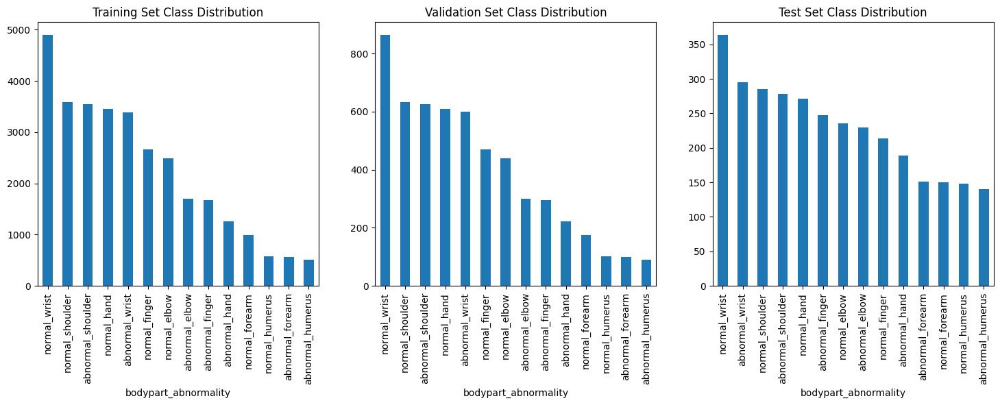

In [ ]:
# Plotting the distribution of classes
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
train_metadata['bodypart_abnormality'].value_counts().plot(kind='bar', ax=axes[0], title='Training Set Class Distribution')
valid_metadata['bodypart_abnormality'].value_counts().plot(kind='bar', ax=axes[1], title='Validation Set Class Distribution')
test_metadata['bodypart_abnormality'].value_counts().plot(kind='bar', ax=axes[2], title='Test Set Class Distribution')
plt.show()

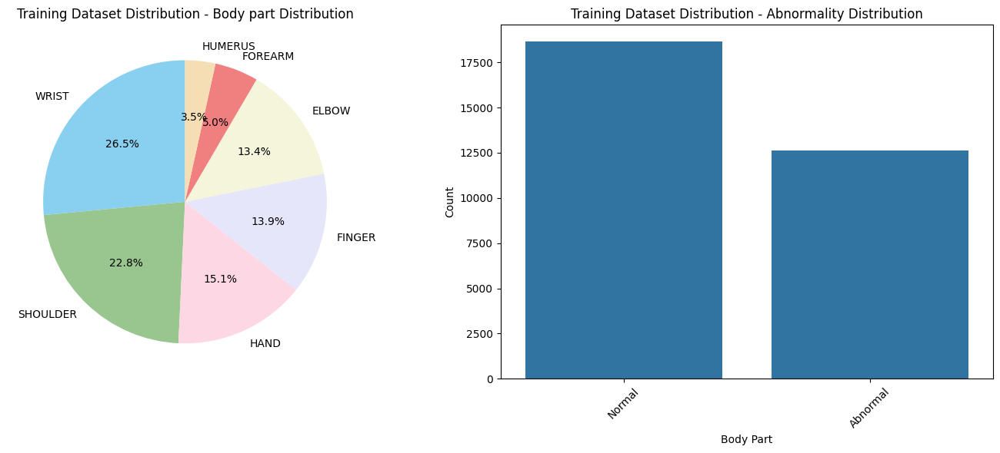

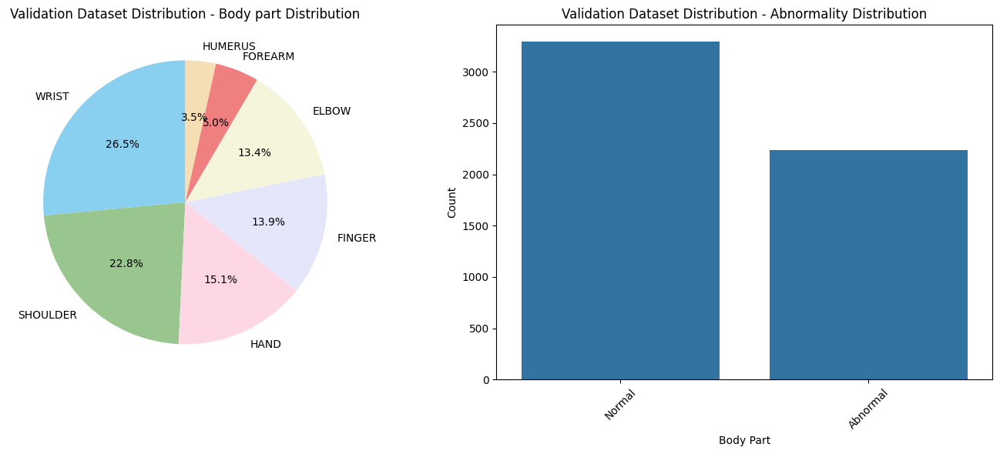

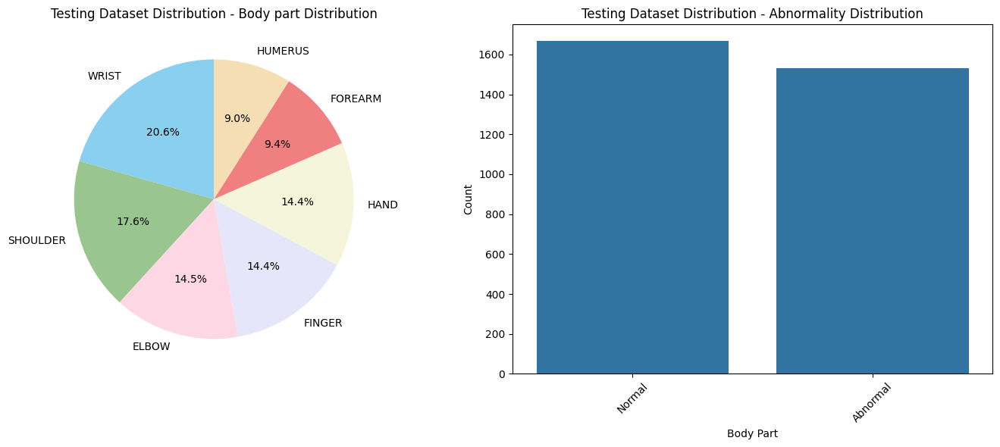

In [ ]:
import seaborn as sns

def plot_distributions(data, dataset_name):
    plt.figure(figsize=(14, 6))

    # Pie chart for abnormalities
    plt.subplot(1, 2, 1)
    colors = ['#89CFF0', '#99C68E', '#FDD7E4', '#E6E6FA', '#F5F5DC', '#F08080', '#F5DEB3']
    data['abnormality'].value_counts().plot.pie(autopct='%1.1f%%', startangle=90, colors=colors)
    plt.title(f'{dataset_name} - Body part Distribution')
    plt.ylabel('')  # Hide the 'abnormality' label on the y-axis

    # Bar chart for body parts
    plt.subplot(1, 2, 2)
    sns.countplot(data=data, x='Body_part', order=data['Body_part'].value_counts().index)
    plt.title(f'{dataset_name} - Abnormality Distribution')
    plt.xlabel('Body Part')
    plt.ylabel('Count')
    plt.xticks(rotation=45)  # Rotate the x-axis labels to avoid overlap

    plt.tight_layout()  # Adjust layout to fit everything nicely
    plt.show()

plot_distributions(train_metadata, 'Training Dataset Distribution')
plot_distributions(valid_metadata, 'Validation Dataset Distribution')
plot_distributions(test_metadata, 'Testing Dataset Distribution')

In [ ]:
pip install opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 MB 39.6 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


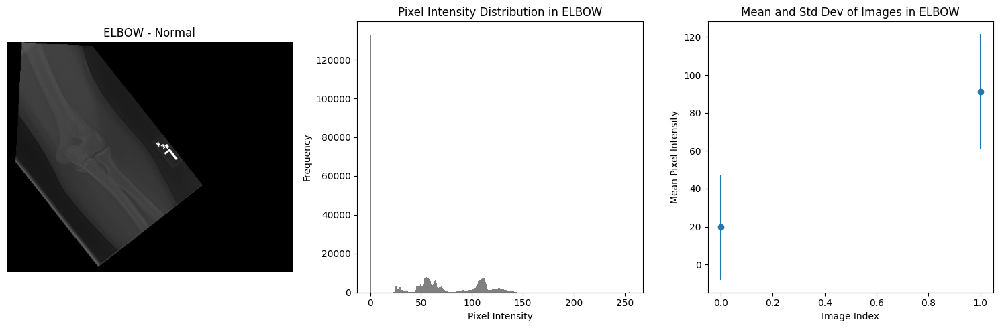

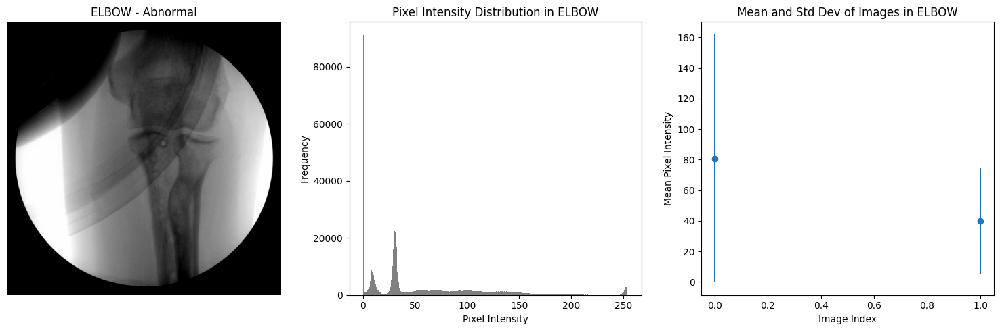

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

def load_images_from_folder(folder, max_images=2):
    images = []
    body_part = folder.split('/')[-1].split('-')[1]  # Assumes folder name includes the body part after 'Abnormal-' or 'Normal-'
    for filename in os.listdir(folder):
        if len(images) >= max_images:
            break  # Stop after loading max_images
        img_path = os.path.join(folder, filename)
        img = Image.open(img_path).convert('L')  # Convert to grayscale
        img = np.array(img)  # Convert to numpy array for analysis
        if img is not None:
            images.append((img, body_part))
    return images

def plot_image_statistics(images_info, title):
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    first_image, body_part = images_info[0]

    # Plot first image
    axs[0].imshow(first_image, cmap='gray')
    axs[0].set_title(f'{body_part} - {title}')
    axs[0].axis('off')

    # Aggregate pixel values from all images for histogram
    pixel_values = [pixel for img, _ in images_info for pixel in img.ravel()]
    axs[1].hist(pixel_values, bins=256, color='gray')
    axs[1].set_title(f'Pixel Intensity Distribution in {body_part}')
    axs[1].set_xlabel('Pixel Intensity')
    axs[1].set_ylabel('Frequency')

    # Compute image mean and std dev
    mean_vals = [np.mean(img) for img, _ in images_info]
    std_vals = [np.std(img) for img, _ in images_info]
    axs[2].errorbar(range(len(images_info)), mean_vals, yerr=std_vals, fmt='o')
    axs[2].set_title(f'Mean and Std Dev of Images in {body_part}')
    axs[2].set_xlabel('Image Index')
    axs[2].set_ylabel('Mean Pixel Intensity')

    plt.tight_layout()
    plt.show()

# Example usage
folder_normal = 'multiclass_train/Normal-ELBOW'
folder_abnormal = 'multiclass_train/Abnormal-ELBOW'

normal_images_info = load_images_from_folder(folder_normal, max_images=2)
abnormal_images_info = load_images_from_folder(folder_abnormal, max_images=2)

plot_image_statistics(normal_images_info, 'Normal')
plot_image_statistics(abnormal_images_info, 'Abnormal')

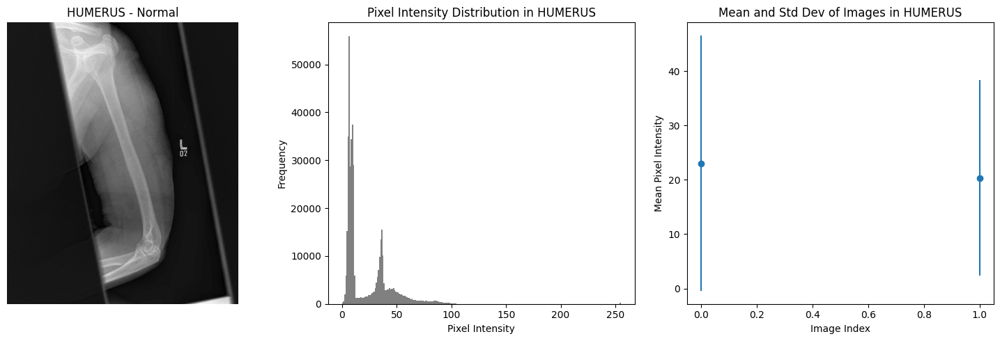

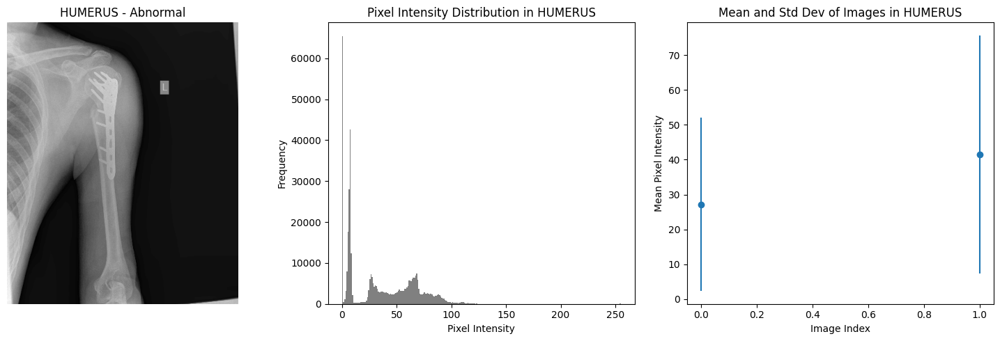

In [ ]:
folder_normal = 'multiclass_train/Normal-HUMERUS'
folder_abnormal = 'multiclass_train/Abnormal-HUMERUS'

# Load only 2 images from each category
normal_images = load_images_from_folder(folder_normal, max_images=2)
abnormal_images = load_images_from_folder(folder_abnormal, max_images=2)

# Plotting statistics for the images
plot_image_statistics(normal_images, 'Normal')
plot_image_statistics(abnormal_images, 'Abnormal')

In [ ]:
import pandas as pd

df_train = pd.read_csv('multiclass_train_metadata.csv')
df_train

,path,Body_part,abnormality,bodypart_abnormality
0,multiclass_train/Abnormal-ELBOW/abnormal_elbow...,Abnormal,ELBOW,abnormal_elbow
1,multiclass_train/Abnormal-ELBOW/abnormal_elbow...,Abnormal,ELBOW,abnormal_elbow
2,multiclass_train/Abnormal-ELBOW/abnormal_elbow...,Abnormal,ELBOW,abnormal_elbow
3,multiclass_train/Abnormal-ELBOW/abnormal_elbow...,Abnormal,ELBOW,abnormal_elbow
4,multiclass_train/Abnormal-ELBOW/abnormal_elbow...,Abnormal,ELBOW,abnormal_elbow
...,...,...,...,...
31276,multiclass_train/Normal-WRIST/normal_wrist_993...,Normal,WRIST,normal_wrist
31277,multiclass_train/Normal-WRIST/normal_wrist_994...,Normal,WRIST,normal_wrist
31278,multiclass_train/Normal-WRIST/normal_wrist_995...,Normal,WRIST,normal_wrist
31279,multiclass_train/Normal-WRIST/normal_wrist_996...,Normal,WRIST,normal_wrist


In [ ]:
import tensorflow as tf

# Check for available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(f"{len(gpus)} Physical GPUs, {len(logical_gpus)} Logical GPU")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)
else:
    print("No GPU is available.")

Physical devices cannot be modified after being initialized


## Setup the data generators for the Modeling phase ##

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def create_train_generator(data_directory, target_size=(224, 224), batch_size=32):
    """Create a training data generator that fetches images from subdirectories."""
    # Initialize the Image Data Generator with some data augmentation options
    train_datagen = ImageDataGenerator(
        rescale=1./255,  # Normalize the image pixels to [0, 1]
        rotation_range=40,  # Random rotation in the range (-40, 40)
        width_shift_range=0.2,  # Random horizontal shift
        height_shift_range=0.2,  # Random vertical shift
        shear_range=0.2,  # Shear transformations
        zoom_range=0.2,  # Zooming
        horizontal_flip=True,  # Enable horizontal flipping
        fill_mode='nearest'  # Strategy to fill newly created pixels after a transformation
    )

    # Flow images from the specified directory, and automatically label them based on the folder names
    train_generator = train_datagen.flow_from_directory(
        directory=data_directory,  # Path to the target directory
        target_size=target_size,  # Resize all images to this size
        batch_size=batch_size,  # Number of images to return each time
        class_mode='categorical'  # Because we are doing multi-class classification
    )

    return train_generator

# Usage
train_directory = 'multiclass_train'  # Specify the path to your training directory
train_data_generator = create_train_generator(train_directory)

2024-04-26 07:04:02.688118: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-26 07:04:02.708301: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-26 07:04:02.708313: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-26 07:04:02.708869: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-26 07:04:02.712429: I tensorflow/core/platform/cpu_feature_guar

Found 31281 images belonging to 14 classes.


## Freezing all the layers and training the model with additional new layers of GlobalAveragePooling ##

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

def build_model(num_classes):
    # Load the pre-trained DenseNet model, excluding the top fully connected layer
    base_model = DenseNet121(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

    # Freeze all layers in the base model
    for layer in base_model.layers:
        layer.trainable = False

    # Add new layers on top for our specific task
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    # This is the model we will train
    model = Model(inputs=base_model.input, outputs=predictions)

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Example usage
model = build_model(num_classes=14)  # Adjust `num_classes` based on your specific task
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1/conv[0][0]']      

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_data_generator

validation_generator = val_datagen.flow_from_directory(
    'multiclass_valid',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')

# Set up callbacks
checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True, monitor='val_loss', mode='min')
early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1, mode='min')

# Train the model
model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=50,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[checkpoint, early_stopping])

Found 5527 images belonging to 14 classes.
Epoch 1/50


2024-04-14 03:48:48.958056: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8906
2024-04-14 03:48:50.085899: I external/local_xla/xla/service/service.cc:168] XLA service 0x961ad70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-04-14 03:48:50.085926: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 4090, Compute Capability 8.9
2024-04-14 03:48:50.095037: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1713066530.152355     657 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


977/977 [==============================] - ETA: 0s - loss: 1.3245 - accuracy: 0.5329

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


977/977 [==============================] - 309s 313ms/step - loss: 1.3245 - accuracy: 0.5329 - val_loss: 0.9605 - val_accuracy: 0.6317
Epoch 2/50
977/977 [==============================] - 266s 272ms/step - loss: 1.0050 - accuracy: 0.6170 - val_loss: 0.8694 - val_accuracy: 0.6515
Epoch 3/50
977/977 [==============================] - 267s 273ms/step - loss: 0.9311 - accuracy: 0.6391 - val_loss: 0.8522 - val_accuracy: 0.6543
Epoch 4/50
977/977 [==============================] - 265s 272ms/step - loss: 0.8884 - accuracy: 0.6529 - val_loss: 0.8113 - val_accuracy: 0.6691
Epoch 5/50
977/977 [==============================] - 267s 273ms/step - loss: 0.8635 - accuracy: 0.6585 - val_loss: 0.8185 - val_accuracy: 0.6639
Epoch 6/50
977/977 [==============================] - 264s 270ms/step - loss: 0.8412 - accuracy: 0.6634 - val_loss: 0.7854 - val_accuracy: 0.6731
Epoch 7/50
977/977 [==============================] - 265s 271ms/step - loss: 0.8246 - accuracy: 0.6717 - val_loss: 0.7766 - val_accura

KeyboardInterrupt: 

## Unfreeze the last layer of the Dense121 Model architecture ##

In [ ]:
def build_model(num_classes, unfreeze_last_conv=False):
    # Load the pre-trained DenseNet model, excluding the top fully connected layer
    base_model = DenseNet121(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

    # Optionally unfreeze the last convolutional layer
    if unfreeze_last_conv:
        base_model.get_layer('conv5_block16_2_conv').trainable = True

    # Freeze all other layers in the base model
    for layer in base_model.layers[:-1]:  # Skip the last layer from automatic freezing
        if layer.name != 'conv5_block16_2_conv':
            layer.trainable = False

    # Add new layers on top for our specific task
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    # This is the model we will train
    model = Model(inputs=base_model.input, outputs=predictions)

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Unfreeze the last conv layer and build the model
model = build_model(num_classes=14, unfreeze_last_conv=True)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d_2 (ZeroPadd  (None, 230, 230, 3)          0         ['input_2[0][0]']             
 ing2D)                                                                                           
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d_2[0][0]']    
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1/conv[0][0]']    

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Initialize the data generators
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_data_generator

validation_generator = val_datagen.flow_from_directory(
    'multiclass_valid',  # This should be the path to your validation data
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')

# Set up callbacks for saving the best model and early stopping
checkpoint = ModelCheckpoint('last_layer_unfreeze_model.h5', save_best_only=True, monitor='val_loss', mode='min')
early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1, mode='min')

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=20,  # Set epochs to 20 for retraining
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[checkpoint, early_stopping])


Found 5527 images belonging to 14 classes.
Found 5527 images belonging to 14 classes.
Epoch 1/20
977/977 [==============================] - 272s 273ms/step - loss: 1.2909 - accuracy: 0.5413 - val_loss: 0.9361 - val_accuracy: 0.6306
Epoch 2/20
977/977 [==============================] - 265s 271ms/step - loss: 0.9698 - accuracy: 0.6247 - val_loss: 0.8535 - val_accuracy: 0.6497
Epoch 3/20
977/977 [==============================] - 270s 276ms/step - loss: 0.8985 - accuracy: 0.6442 - val_loss: 0.8521 - val_accuracy: 0.6617
Epoch 4/20
977/977 [==============================] - 268s 274ms/step - loss: 0.8649 - accuracy: 0.6543 - val_loss: 0.7969 - val_accuracy: 0.6902
Epoch 5/20
977/977 [==============================] - 266s 272ms/step - loss: 0.8373 - accuracy: 0.6637 - val_loss: 0.7719 - val_accuracy: 0.6899
Epoch 6/20
977/977 [==============================] - 266s 272ms/step - loss: 0.8175 - accuracy: 0.6725 - val_loss: 0.7555 - val_accuracy: 0.6824
Epoch 7/20
977/977 [==================

## Unfreezing the last 2 layers and retraining the Dense121 Model architecture ##

In [ ]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.optimizers import Adam

def build_model(num_classes, unfreeze_last_n_conv=2):
    # Load the pre-trained DenseNet model, excluding the top fully connected layer
    base_model = DenseNet121(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

    # Get the number of layers in the base model
    num_layers = len(base_model.layers)

    # Calculate the index of the first layer to unfreeze
    unfreeze_index = max(-1, -1 - unfreeze_last_n_conv)

    # Unfreeze the last n convolutional layers
    for layer in base_model.layers[unfreeze_index:]:
        layer.trainable = True

    # Freeze all other layers in the base model
    for layer in base_model.layers[:unfreeze_index]:
        layer.trainable = False

    # Add new layers on top for our specific task
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    # This is the model we will train
    model = Model(inputs=base_model.input, outputs=predictions)

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Unfreeze the last 2 conv layers and build the model
model = build_model(num_classes=14, unfreeze_last_n_conv=2)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1/conv[0][0]']      

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import scipy

# Initialize the data generators
val_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_data_generator

validation_generator = val_datagen.flow_from_directory(
    'multiclass_valid',  # This should be the path to your validation data
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')

# Set up callbacks for saving the best model and early stopping
checkpoint = ModelCheckpoint('last_2_layers_unfreeze_model.h5', save_best_only=True, monitor='val_loss', mode='min')
early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1, mode='min')

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=20,  # Set epochs to 20 for retraining
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[checkpoint, early_stopping])

Found 5527 images belonging to 14 classes.
Epoch 1/20


2024-04-15 21:56:36.575208: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8906
2024-04-15 21:56:37.569717: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f8ecce4e560 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-04-15 21:56:37.569751: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 4090, Compute Capability 8.9
2024-04-15 21:56:37.573385: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1713218197.628136    1326 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


977/977 [==============================] - ETA: 0s - loss: 1.3247 - accuracy: 0.5350

/usr/local/lib/python3.11/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


977/977 [==============================] - 274s 277ms/step - loss: 1.3247 - accuracy: 0.5350 - val_loss: 0.9502 - val_accuracy: 0.6328
Epoch 2/20
977/977 [==============================] - 271s 277ms/step - loss: 0.9940 - accuracy: 0.6175 - val_loss: 0.8628 - val_accuracy: 0.6541
Epoch 3/20
977/977 [==============================] - 270s 276ms/step - loss: 0.9279 - accuracy: 0.6426 - val_loss: 0.8375 - val_accuracy: 0.6637
Epoch 4/20
977/977 [==============================] - 273s 279ms/step - loss: 0.8955 - accuracy: 0.6499 - val_loss: 0.8027 - val_accuracy: 0.6842
Epoch 5/20
977/977 [==============================] - 277s 283ms/step - loss: 0.8660 - accuracy: 0.6575 - val_loss: 0.8512 - val_accuracy: 0.6664
Epoch 6/20
977/977 [==============================] - 271s 278ms/step - loss: 0.8445 - accuracy: 0.6626 - val_loss: 0.8054 - val_accuracy: 0.6717
Epoch 7/20
977/977 [==============================] - 269s 276ms/step - loss: 0.8267 - accuracy: 0.6712 - val_loss: 0.7751 - val_accura

## Unfreezing & training the last 4 layers of the Dense121, and adding learning rate scheduler ##

In [ ]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2

def build_model(num_classes, unfreeze_last_n_conv=4):
    # Load the pre-trained DenseNet model, excluding the top fully connected layer
    base_model = DenseNet121(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

    # Unfreeze the last n convolutional layers
    for layer in base_model.layers[-unfreeze_last_n_conv:]:
        layer.trainable = True

    # Add new layers on top for our specific task
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(512, activation='relu', kernel_regularizer=l2(0.01))(x)  # Add L2 regularization
    x = Dropout(0.5)(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    # This is the model we will train
    model = Model(inputs=base_model.input, outputs=predictions)

    # Use a relevant learning rate scheduler
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

    return model, reduce_lr

# Unfreeze the last 4 conv layers and build the model
model, reduce_lr = build_model(num_classes=14, unfreeze_last_n_conv=5)
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d_6 (ZeroPadd  (None, 230, 230, 3)          0         ['input_4[0][0]']             
 ing2D)                                                                                           
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d_6[0][0]']    
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1/conv[0][0]']    

In [ ]:
# Set up callbacks for saving the best model and early stopping
checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True, monitor='val_loss', mode='min')
early_stopping = EarlyStopping(monitor='val_loss', patience=15, verbose=1, mode='min')

train_generator = train_data_generator

validation_generator = val_datagen.flow_from_directory(
    'multiclass_valid',  # This should be the path to your validation data
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical')


# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=15,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[checkpoint, early_stopping, reduce_lr])

Found 5527 images belonging to 14 classes.
Epoch 1/100
977/977 [==============================] - 310s 290ms/step - loss: 4.1665 - accuracy: 0.6475 - val_loss: 2.4543 - val_accuracy: 0.7607 - lr: 1.0000e-04
Epoch 2/100
977/977 [==============================] - 276s 283ms/step - loss: 2.0008 - accuracy: 0.7474 - val_loss: 1.5336 - val_accuracy: 0.7707 - lr: 1.0000e-04
Epoch 3/100
977/977 [==============================] - 280s 286ms/step - loss: 1.3065 - accuracy: 0.7686 - val_loss: 1.1870 - val_accuracy: 0.7433 - lr: 1.0000e-04
Epoch 4/100
977/977 [==============================] - 278s 285ms/step - loss: 0.9394 - accuracy: 0.7819 - val_loss: 0.8568 - val_accuracy: 0.7664 - lr: 1.0000e-04
Epoch 5/100
977/977 [==============================] - 277s 283ms/step - loss: 0.7548 - accuracy: 0.7888 - val_loss: 0.7521 - val_accuracy: 0.7742 - lr: 1.0000e-04
Epoch 6/100
977/977 [==============================] - 283s 290ms/step - loss: 0.6477 - accuracy: 0.7983 - val_loss: 0.6659 - val_accurac

KeyboardInterrupt: 

## Unfreezing the last 5 layers, and increasing the dropout, and L2 decay factor as well

In [ ]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2

def build_model(num_classes, unfreeze_last_n_conv=4):
    # Load the pre-trained DenseNet model, excluding the top fully connected layer
    base_model = DenseNet121(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

    # Unfreeze the last n convolutional layers
    for layer in base_model.layers[-unfreeze_last_n_conv:]:
        layer.trainable = True

    # Add new layers on top for our specific task
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(512, activation='relu', kernel_regularizer=l2(0.1))(x)  # Add L2 regularization
    x = Dropout(0.6)(x)
    predictions = Dense(num_classes, activation='softmax')(x)

    # This is the model we will train
    model = Model(inputs=base_model.input, outputs=predictions)

    # Use a relevant learning rate scheduler
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)

    # Compile the model
    model.compile(optimizer=Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

    return model, reduce_lr

# Unfreeze the last 5 conv layers and build the model
model, reduce_lr = build_model(num_classes=14, unfreeze_last_n_conv=5)
model.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_6 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d_10 (ZeroPad  (None, 230, 230, 3)          0         ['input_6[0][0]']             
 ding2D)                                                                                          
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d_10[0][0]']   
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1/conv[0][0]']    

In [ ]:
# Set up callbacks for saving the best model and early stopping
checkpoint = ModelCheckpoint('5L_unfreeze_model.keras', save_best_only=True, monitor='val_loss', mode='min')
early_stopping = EarlyStopping(monitor='val_loss', patience=5, verbose=1, mode='min')

train_generator = train_data_generator

validation_generator = val_datagen.flow_from_directory(
    'multiclass_valid',  # This should be the path to your validation data
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical')


# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=10,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[checkpoint, early_stopping, reduce_lr])

Found 5527 images belonging to 14 classes.
Epoch 1/15
977/977 [==============================] - 307s 285ms/step - loss: 18.4167 - accuracy: 0.6375 - val_loss: 2.1707 - val_accuracy: 0.7571 - lr: 1.0000e-04
Epoch 2/15
977/977 [==============================] - 278s 285ms/step - loss: 1.1893 - accuracy: 0.7398 - val_loss: 0.7785 - val_accuracy: 0.7614 - lr: 1.0000e-04
Epoch 3/15
977/977 [==============================] - 283s 289ms/step - loss: 0.7354 - accuracy: 0.7582 - val_loss: 0.6452 - val_accuracy: 0.7814 - lr: 1.0000e-04
Epoch 4/15
977/977 [==============================] - 275s 282ms/step - loss: 0.6764 - accuracy: 0.7752 - val_loss: 0.6969 - val_accuracy: 0.7678 - lr: 1.0000e-04
Epoch 5/15
977/977 [==============================] - 278s 284ms/step - loss: 0.6529 - accuracy: 0.7806 - val_loss: 0.6614 - val_accuracy: 0.7767 - lr: 1.0000e-04
Epoch 6/15
977/977 [==============================] - 278s 284ms/step - loss: 0.6265 - accuracy: 0.7886 - val_loss: 0.6154 - val_accuracy: 0.

## Adding attention layers

In [ ]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Conv2D, Multiply
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Function to build the correct model
def build_model(num_classes, unfreeze_last_n_conv=4):
    # Load DenseNet121 without the top fully connected layer
    base_model = DenseNet121(include_top=False, weights='imagenet', input_shape=(224, 224, 3))  # Ensure correct base model

    # Unfreeze the last n convolutional layers
    for layer in base_model.layers[-unfreeze_last_n_conv:]:
        layer.trainable = True

    # Add new layers with correct connections
    x = base_model.output  # Use base_model's output
    attention = Conv2D(1, kernel_size=1, activation='sigmoid', name='attention')(x)  # For attention mechanism
    x = Multiply()([x, attention])  # Multiply with attention
    x = GlobalAveragePooling2D()(x)  # Ensure correct application

    # Continue with additional layers
    x = Dense(512, activation='relu', kernel_regularizer=l2(0.1))(x)  # Fully connected layer
    x = Dropout(0.6)(x)  # Dropout to prevent overfitting
    predictions = Dense(num_classes, activation='softmax')(x)  # Output for multi-class classification

    # Build the complete model
    model = Model(inputs=base_model.input, outputs=predictions)  # Ensure correct connections

    # Learning rate scheduler
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)

    # Compile the model with correct loss function and metrics
    model.compile(optimizer=Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

    return model, reduce_lr

# Build the model with correct architecture
model, reduce_lr = build_model(num_classes=14, unfreeze_last_n_conv=5)

checkpoint = ModelCheckpoint('attention_model.keras', monitor='val_loss', save_best_only=True, mode='min')  # Save best model

# Compile the model with correct settings
model.compile(optimizer=Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Use ImageDataGenerator for data augmentation
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_directory(
    'multiclass_train',  # Path to training data
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'  # Use 'categorical' for multi-class one-hot encoded labels
)

val_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = val_datagen.flow_from_directory(
    'multiclass_valid',  # Path to validation data
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'  # Ensure class mode matches the label encoding
)

# Train the model with correct structure
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=150,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[checkpoint, early_stopping, reduce_lr]
)

# Check the shapes of labels and predictions
for batch_data, batch_labels in train_generator:
    predictions = model.predict(batch_data)  # Ensure correct predictions
    print("Label shape:", batch_labels.shape)  # Should be 1-dimensional for multi-class
    print("Prediction shape:", predictions[0].shape)  # Should be (14,)
    break

Found 31281 images belonging to 14 classes.
Found 5527 images belonging to 14 classes.
Epoch 1/150
488/488 [==============================] - 158s 274ms/step - loss: 63.1427 - accuracy: 0.3626 - val_loss: 55.9561 - val_accuracy: 0.5609 - lr: 1.0000e-05
Epoch 2/150
228/488 [=============>................] - ETA: 59s - loss: 53.0426 - accuracy: 0.5747 

KeyboardInterrupt: 

## Attention_Heads = 4, below with 1 attention layer

In [ ]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Conv2D, Multiply, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator


def build_model(num_classes, unfreeze_last_n_conv=4, num_attention_heads=1):
    # Load DenseNet121 without the top fully connected layer
    base_model = DenseNet121(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

    # Unfreeze the last n convolutional layers
    for layer in base_model.layers[-unfreeze_last_n_conv:]:
        layer.trainable = True

    # Add multiple attention heads and concatenate them
    x = base_model.output
    attention_heads = []

    for i in range(num_attention_heads):
        attention = Conv2D(1, kernel_size=1, activation='sigmoid', name=f'attention_{i}')(x)  # Define attention heads
        attention_heads.append(Multiply()([x, attention]))  # Apply attention

    # Concatenate attention outputs
    x = Concatenate(axis=-1)(attention_heads)  # Concatenate along the last axis

    # Continue with additional layers
    x = GlobalAveragePooling2D()(x)  # Apply global average pooling
    x = Dense(512, activation='relu', kernel_regularizer=l2(0.1))(x)  # Fully connected layer
    x = Dropout(0.6)(x)  # Dropout for regularization
    predictions = Dense(num_classes, activation='softmax')(x)  # Output for multi-class classification

    # Build the complete model
    model = Model(inputs=base_model.input, outputs=predictions)

    # Learning rate scheduler
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)

    # Compile the model with correct loss function and metrics
    model.compile(optimizer=Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

    return model, reduce_lr

# Build the model with the desired number of attention heads
model, reduce_lr = build_model(num_classes=14, unfreeze_last_n_conv=5, num_attention_heads=3)  # Adjust the number of heads
model.summary()

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_10 (InputLayer)       [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d_18 (ZeroPad  (None, 230, 230, 3)          0         ['input_10[0][0]']            
 ding2D)                                                                                          
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d_18[0][0]']   
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1/conv[0][0]']    

In [ ]:
checkpoint = ModelCheckpoint('attention_model_heads3.keras', monitor='val_loss', save_best_only=True, mode='min')  # Save best model

# Compile the model with correct settings
model.compile(optimizer=Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Use ImageDataGenerator for data augmentation
train_datagen = ImageDataGenerator(rescale=1./255)
train_generator = train_datagen.flow_from_directory(
    'multiclass_train',  # Path to training data
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'  # Use 'categorical' for multi-class one-hot encoded labels
)

val_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = val_datagen.flow_from_directory(
    'multiclass_valid',  # Path to validation data
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'  # Ensure class mode matches the label encoding
)

# Train the model with correct structure
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=150,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[checkpoint, early_stopping, reduce_lr]
)

# Check the shapes of labels and predictions
for batch_data, batch_labels in train_generator:
    predictions = model.predict(batch_data)  # Ensure correct predictions
    print("Label shape:", batch_labels.shape)  # Should be 1-dimensional for multi-class
    print("Prediction shape:", predictions[0].shape)  # Should be (14,)
    break

Found 31281 images belonging to 14 classes.
Found 5527 images belonging to 14 classes.
Epoch 1/150
488/488 [==============================] - 163s 282ms/step - loss: 77.3614 - accuracy: 0.4191 - val_loss: 65.4911 - val_accuracy: 0.5990 - lr: 1.0000e-05
Epoch 2/150
488/488 [==============================] - 133s 273ms/step - loss: 56.1772 - accuracy: 0.6236 - val_loss: 47.5264 - val_accuracy: 0.6971 - lr: 1.0000e-05
Epoch 3/150
488/488 [==============================] - 133s 273ms/step - loss: 40.6021 - accuracy: 0.6947 - val_loss: 34.1380 - val_accuracy: 0.7453 - lr: 1.0000e-05
Epoch 4/150
488/488 [==============================] - 132s 270ms/step - loss: 29.0004 - accuracy: 0.7385 - val_loss: 24.2441 - val_accuracy: 0.7596 - lr: 1.0000e-05
Epoch 5/150
488/488 [==============================] - 133s 272ms/step - loss: 20.4494 - accuracy: 0.7660 - val_loss: 17.0008 - val_accuracy: 0.7753 - lr: 1.0000e-05
Epoch 6/150
488/488 [==============================] - 132s 270ms/step - loss: 14.2

## Additional drop out and strong L1 for the above architecture to reduce the Overfitting

In [ ]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Conv2D, Multiply, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.regularizers import l2

def build_model(num_classes, unfreeze_last_n_conv=4, num_attention_heads=1):
    # Load DenseNet121 without the top fully connected layer
    base_model = DenseNet121(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

    # Unfreeze the last n convolutional layers
    for layer in base_model.layers[-unfreeze_last_n_conv:]:
        layer.trainable = True

    # Add multiple attention heads and concatenate them
    x = base_model.output
    attention_heads = []

    for i in range(num_attention_heads):
        attention = Conv2D(1, kernel_size=1, activation='sigmoid', name=f'attention_{i}')(x)  # Define attention heads
        attention_heads.append(Multiply()([x, attention]))  # Apply attention

    # Concatenate attention outputs
    x = Concatenate(axis=-1)(attention_heads)  # Concatenate along the last axis

    # Dropout without dense layer
    x = Dropout(0.5)(x)  # Dropout to add regularization before pooling

    # Continue with additional layers
    x = GlobalAveragePooling2D()(x)  # Global Average Pooling

    # More dropout to enhance regularization
    x = Dropout(0.7)(x)  # Increased dropout after pooling

    # First fully connected layer with dropout
    x = Dense(512, activation='relu', kernel_regularizer=l2(0.1))(x)  # First dense layer
    x = Dropout(0.7)(x)  # Dropout for stronger regularization

    # Additional fully connected layer with dropout
    x = Dense(256, activation='relu', kernel_regularizer=l2(0.1))(x)  # Second dense layer
    x = Dropout(0.6)(x)  # Additional dropout between dense layers

    predictions = Dense(num_classes, activation='softmax')(x)  # Output for multi-class classification

    # Build the complete model
    model = Model(inputs=base_model.input, outputs=predictions)

    # Learning rate scheduler
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)

    # Compile the model with correct loss function and metrics
    model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

    return model, reduce_lr

# Build the model with an additional dense layer and dropout
model, reduce_lr = build_model(num_classes=14, unfreeze_last_n_conv=5, num_attention_heads=3)  # Custom parameters
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d_2 (ZeroPadd  (None, 230, 230, 3)          0         ['input_2[0][0]']             
 ing2D)                                                                                           
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d_2[0][0]']    
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1/conv[0][0]']    

In [ ]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Conv2D, Multiply, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping  # Import ModelCheckpoint and EarlyStopping
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import scipy

# Define model checkpoint to save the best model
checkpoint = ModelCheckpoint('attention_model_heads3_dropout2.keras', monitor='val_loss', save_best_only=True, mode='min')

# Define early stopping to halt training when improvement stops
early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1, mode='min')

# Compile the model with correct settings
model.compile(optimizer=Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Data augmentation and scaling
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Scale pixel values
    rotation_range=30,  # Data augmentation
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Set up data generators for training and validation
train_generator = train_datagen.flow_from_directory(
    'multiclass_train',  # Path to training data
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'  # One-hot encoded labels
)

val_datagen = ImageDataGenerator(rescale=1./255)  # Just rescaling for validation
validation_generator = val_datagen.flow_from_directory(
    'multiclass_valid',  # Path to validation data
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'
)

# Train the model with additional callbacks
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=150,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[checkpoint, early_stopping, reduce_lr]
)

# Check predictions
for batch_data, batch_labels in train_generator:
    predictions = model.predict(batch_data)  # Check the predictions
    print("Label shape:", batch_labels.shape)  # Should match number of classes
    print("Prediction shape:", predictions[0].shape)  # Should have 14 elements for 14 classes
    break

Found 31281 images belonging to 14 classes.
Found 5527 images belonging to 14 classes.
Epoch 1/150


2024-04-28 07:02:13.736836: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel_1/dropout_4/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


488/488 [==============================] - 315s 592ms/step - loss: 113.3749 - accuracy: 0.0856 - val_loss: 101.0694 - val_accuracy: 0.2209 - lr: 1.0000e-05
Epoch 2/150
488/488 [==============================] - 277s 567ms/step - loss: 90.5911 - accuracy: 0.1115 - val_loss: 80.3650 - val_accuracy: 0.2280 - lr: 1.0000e-05
Epoch 3/150
488/488 [==============================] - 279s 572ms/step - loss: 71.4874 - accuracy: 0.1360 - val_loss: 62.9087 - val_accuracy: 0.2133 - lr: 1.0000e-05
Epoch 4/150
488/488 [==============================] - 277s 566ms/step - loss: 55.7127 - accuracy: 0.1864 - val_loss: 48.6160 - val_accuracy: 0.3421 - lr: 1.0000e-05
Epoch 5/150
488/488 [==============================] - 275s 564ms/step - loss: 43.0940 - accuracy: 0.2782 - val_loss: 37.4654 - val_accuracy: 0.3777 - lr: 1.0000e-05
Epoch 6/150
488/488 [==============================] - 278s 570ms/step - loss: 33.3736 - accuracy: 0.3420 - val_loss: 29.0583 - val_accuracy: 0.4119 - lr: 1.0000e-05
Epoch 7/150
48

## Evaluation with Attention Maps

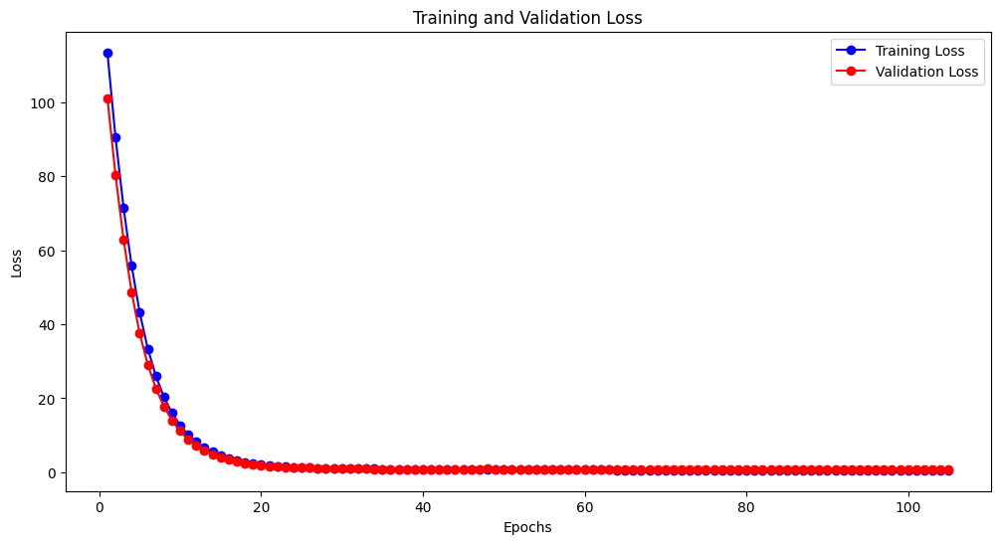

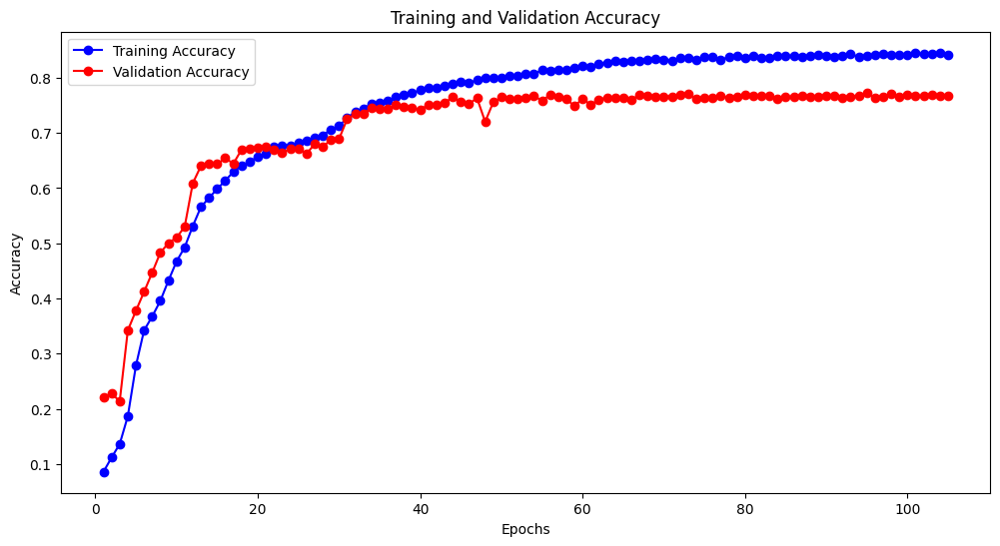

In [ ]:
import matplotlib.pyplot as plt

# Extract history data
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(1, len(train_loss) + 1)  # Number of epochs

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.plot(epochs, train_loss, 'bo-', label='Training Loss')  # Blue dots
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')  # Red dots
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.plot(epochs, train_acc, 'bo-', label='Training Accuracy')
plt.plot(epochs, val_acc, 'ro-', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

2/2 [==============================] - 0s 251ms/step


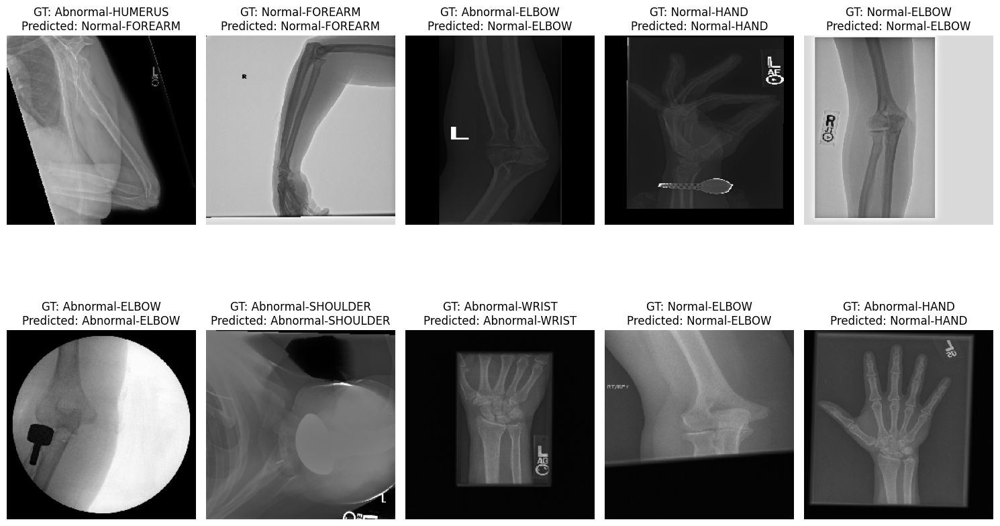

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Get the class indices and class names from the test generator
class_indices = test_generator.class_indices
classes = list(class_indices.keys())  # List of class names

# Get a batch of test images and their ground-truth labels
test_images, test_labels = test_generator[0]  # Get first batch from the test dataset
test_labels = np.argmax(test_labels, axis=1)  # Convert one-hot to class indices

# Get predictions for the test images
predictions = model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)  # Get class indices for predictions

# Display the first 10 test images with their predicted and ground-truth classes
plt.figure(figsize=(15, 10))
for i in range(10):
    plt.subplot(2, 5, i + 1)  # Arrange in a 2x5 grid
    plt.imshow(test_images[i])  # Display the image
    plt.axis('off')  # Hide axis
    # Display ground-truth and predicted classes
    plt.title(f"GT: {classes[test_labels[i]]}\nPredicted: {classes[predicted_labels[i]]}")

plt.tight_layout()  # Adjust layout for better spacing
plt.show()

In [ ]:
# Ensure tf-keras-vis is installed for Grad-CAM
!pip install tf-keras-vis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.5/52.5 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 313.5/313.5 kB 15.1 MB/s eta 0:00:00

[notice] A new release of pip is available: 23.3.1 -> 24.0
[notice] To update, run: python3 -m pip install --upgrade pip


2/2 [==============================] - 0s 189ms/step


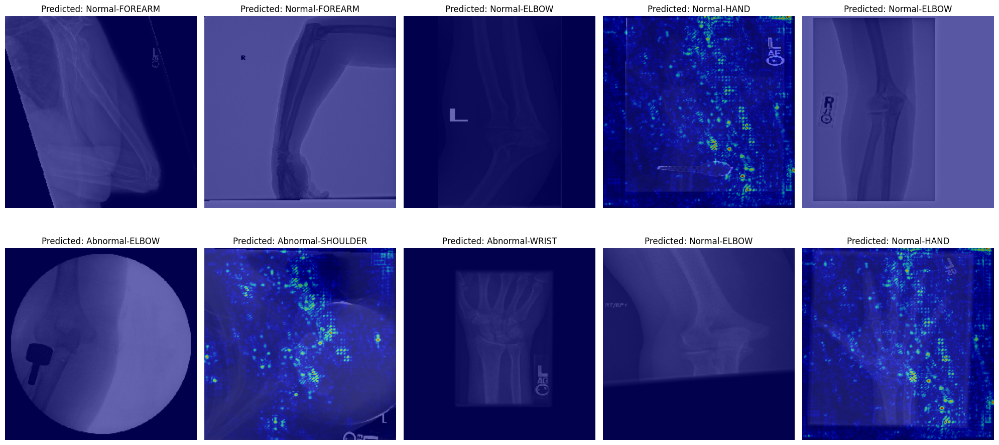

In [ ]:
from tf_keras_vis.saliency import Saliency
from tf_keras_vis.utils.model_modifiers import ExtractIntermediateLayer
from tf_keras_vis.utils.scores import CategoricalScore
import matplotlib.pyplot as plt
import numpy as np

# Select the layer to visualize for saliency maps
layer_name = 'conv5_block16_2_conv'  # Change to your chosen layer
extractor = ExtractIntermediateLayer(layer_name)
saliency = Saliency(model, model_modifier=extractor)

# Get the class names from the test generator
class_indices = test_generator.class_indices
classes = list(class_indices.keys())  # List of class names

# Get a batch of test images for visualization
test_images, test_labels = test_generator[0]  # Load a batch from test data

# Predict class labels for the test images
predictions = model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)  # Get predicted class indices

# Visualize attention maps for 10 sample test images
plt.figure(figsize=(20, 10))  # Create a larger figure for better visualization
for i in range(10):  # Iterate over the first 10 test images
    plt.subplot(2, 5, i + 1)  # Create a 2x5 grid for the images
    score = CategoricalScore([predicted_classes[i]])  # Score for predicted class

    # Compute the saliency (attention) map for the current image
    saliency_map = saliency(score, test_images)

    # Display the original image with the attention map
    plt.imshow(test_images[i])  # Original image
    plt.imshow(saliency_map[0], cmap='jet', alpha=0.6)  # Attention map
    predicted_label = classes[predicted_classes[i]]  # Get predicted class name
    plt.title(f'Predicted: {predicted_label}')  # Add predicted class to title
    plt.axis('off')  # Hide axis for better visualization

plt.tight_layout()  # Adjust layout for better spacing
plt.show()  # Display the visualization

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


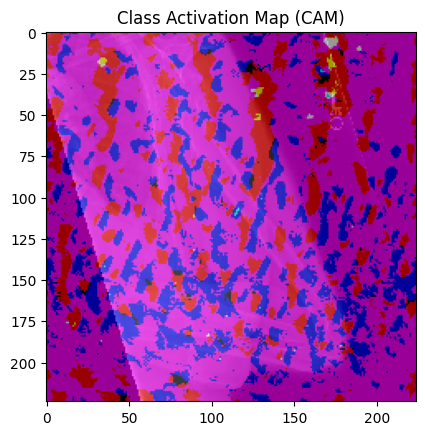

In [ ]:
from tf_keras_vis.activation_maximization import ActivationMaximization
from tf_keras_vis.utils.model_modifiers import ExtractIntermediateLayer
from tf_keras_vis.utils.scores import CategoricalScore
import matplotlib.pyplot as plt
import numpy as np

# Select the layer to visualize for CAM (usually the last convolutional layer before pooling)
cam_layer_name = 'conv5_block16_concat'  # Change as needed
extractor = ExtractIntermediateLayer(cam_layer_name)

# Define a Categorical Score for the desired class
desired_class_index = 0  # Change to the desired class index for visualization
score = CategoricalScore([desired_class_index])

# Create the CAM generator
activation_maximization = ActivationMaximization(model, model_modifier=extractor)

# Get a sample test image
sample_image, _ = test_generator[0]

# Compute the Class Activation Map (CAM)
cam_map = activation_maximization(score, sample_image)

# Display the CAM over the original image
plt.imshow(sample_image[0])  # Original image
plt.imshow(cam_map[0], cmap='jet', alpha=0.6)  # CAM with transparency
plt.title(f'Class Activation Map (CAM)')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import cv2

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = Model(
        inputs=[model.inputs],
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        loss = preds[:, pred_index]

    grads = tape.gradient(loss, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]

    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def display_gradcam(img, heatmap, alpha=0.4):
    img = img_to_array(img)
    heatmap = np.uint8(255 * heatmap)
    jet = plt.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]
    jet_heatmap = cv2.resize(jet_heatmap, (img.shape[1], img.shape[0]))
    jet_heatmap = (jet_heatmap * 255).astype("uint8")
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = np.clip(superimposed_img, 0, 255).astype("uint8")
    plt.imshow(superimposed_img)
    plt.axis("off")

# Example usage:
# Assuming `test_images` are preprocessed appropriately for your model
for i in range(10):
    img_array = np.expand_dims(test_images[i], axis=0)  # Expand dims to add the batch size
    heatmap = make_gradcam_heatmap(img_array, model, "relu")
    plt.figure()
    plt.subplot(121)
    plt.imshow(test_images[i])
    plt.title(f"Original Image\nPredicted: {classes[predicted_labels[i]]}, True: {classes[test_labels[i]]}")
    plt.axis('off')
    plt.subplot(122)
    display_gradcam(test_images[i], heatmap)
    plt.title("Grad-CAM")
    plt.show()

## Tweaking the architecture with squeeze attention blocks, and dense blocks

In [ ]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, Conv2D, Multiply, Concatenate, GlobalAveragePooling2D
from tensorflow.keras.layers import Activation, BatchNormalization, Add, Reshape, multiply
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import ReduceLROnPlateau

def squeeze_excite_block(input, ratio=16):
    init = input
    channel_axis = -1
    filters = init.shape[channel_axis]
    se_shape = (1, 1, filters)

    se = GlobalAveragePooling2D()(init)
    se = Reshape(se_shape)(se)
    se = Dense(filters // ratio, activation='relu')(se)
    se = Dense(filters, activation='sigmoid')(se)

    x = multiply([init, se])
    return x

def fc_block(x):
    shortcut = x
    x = Dense(512, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.5)(x)
    x = Dense(512)(x)
    x = BatchNormalization()(x)

    shortcut = Dense(512, use_bias=False)(shortcut)  # Adjusting the dimension if necessary
    shortcut = BatchNormalization()(shortcut)

    x = Add()([x, shortcut])  # Adding skip connection
    x = Activation('relu')(x)
    x = Dropout(0.5)(x)
    return x

def build_model(num_classes, unfreeze_last_n_conv=4, num_attention_heads=1):
    # Load DenseNet121 without the top fully connected layer
    base_model = DenseNet121(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

    # Unfreeze the last n convolutional layers
    for layer in base_model.layers[-unfreeze_last_n_conv:]:
        layer.trainable = True

    # Adding Squeeze-and-Excitation blocks
    x = base_model.output
    x = squeeze_excite_block(x)

    # Add multiple attention heads and concatenate them
    attention_heads = []
    for i in range(num_attention_heads):
        attention = Conv2D(1, kernel_size=1, activation='sigmoid', name=f'attention_{i}')(x)
        attention_heads.append(Multiply()([x, attention]))  # Apply attention

    x = Concatenate(axis=-1)(attention_heads)  # Concatenate along the last axis
    x = Dropout(0.5)(x)  # Dropout to add regularization before pooling
    x = GlobalAveragePooling2D()(x)  # Global Average Pooling
    x = Dropout(0.7)(x)  # Increased dropout after pooling

    # Advanced Fully Connected layers
    x = fc_block(x)
    x = Dense(256, activation='relu', kernel_regularizer=l2(0.1))(x)
    x = Dropout(0.6)(x)
    predictions = Dense(num_classes, activation='softmax')(x)  # Output for multi-class classification

    # Build the complete model
    model = Model(inputs=base_model.input, outputs=predictions)

    # Learning rate scheduler
    reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)

    # Compile the model with correct loss function and metrics
    model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

    return model, reduce_lr

# Build the model with custom parameters
model, reduce_lr = build_model(num_classes=14, unfreeze_last_n_conv=5, num_attention_heads=3)
model.summary()

29084464/29084464 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  

In [ ]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, Conv2D, Multiply, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pickle
import os

# Setup ModelCheckpoint and EarlyStopping
checkpoint = ModelCheckpoint('attention_heads3_dropout_denseblock_3.keras', monitor='val_loss', save_best_only=True, mode='min')
early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1, mode='min')

# Assume model is already defined and compiled as in your previous messages
# If not, make sure to define and compile the model here.

# Data augmentation setup for training
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

# Prepare data generators
train_generator = train_datagen.flow_from_directory(
    'multiclass_train',
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'
)

val_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = val_datagen.flow_from_directory(
    'multiclass_valid',
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical'
)

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=150,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[checkpoint, reduce_lr, early_stopping]
)

# Save the training history
with open('attention_training_history.pkl', 'wb') as f:
    pickle.dump(history.history, f)

Found 31281 images belonging to 14 classes.
Found 5527 images belonging to 14 classes.
Epoch 1/150


2024-04-30 23:17:10.067886: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2024-04-30 23:17:12.457233: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8906
2024-04-30 23:17:14.101548: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f73a4c8b330 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-04-30 23:17:14.101570: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 4090, Compute Capability 8.9
2024-04-30 23:17:14.104559: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1714519034.149418   50289 device_compiler.h:186] Compiled cluster using XLA!  T

488/488 [==============================] - 333s 621ms/step - loss: 24.3717 - accuracy: 0.2916 - val_loss: 13.4177 - val_accuracy: 0.5447 - lr: 1.0000e-04
Epoch 2/150
488/488 [==============================] - 279s 571ms/step - loss: 8.3657 - accuracy: 0.5310 - val_loss: 4.4049 - val_accuracy: 0.6455 - lr: 1.0000e-04
Epoch 3/150
488/488 [==============================] - 276s 565ms/step - loss: 2.9481 - accuracy: 0.6111 - val_loss: 1.7289 - val_accuracy: 0.6853 - lr: 1.0000e-04
Epoch 4/150
488/488 [==============================] - 275s 564ms/step - loss: 1.3917 - accuracy: 0.6702 - val_loss: 0.9959 - val_accuracy: 0.7115 - lr: 1.0000e-04
Epoch 5/150
488/488 [==============================] - 276s 565ms/step - loss: 0.9562 - accuracy: 0.7118 - val_loss: 0.7865 - val_accuracy: 0.7455 - lr: 1.0000e-04
Epoch 6/150
488/488 [==============================] - 278s 569ms/step - loss: 0.8172 - accuracy: 0.7377 - val_loss: 0.7652 - val_accuracy: 0.7266 - lr: 1.0000e-04
Epoch 7/150
488/488 [=====

## Evaluation and Attention Maps

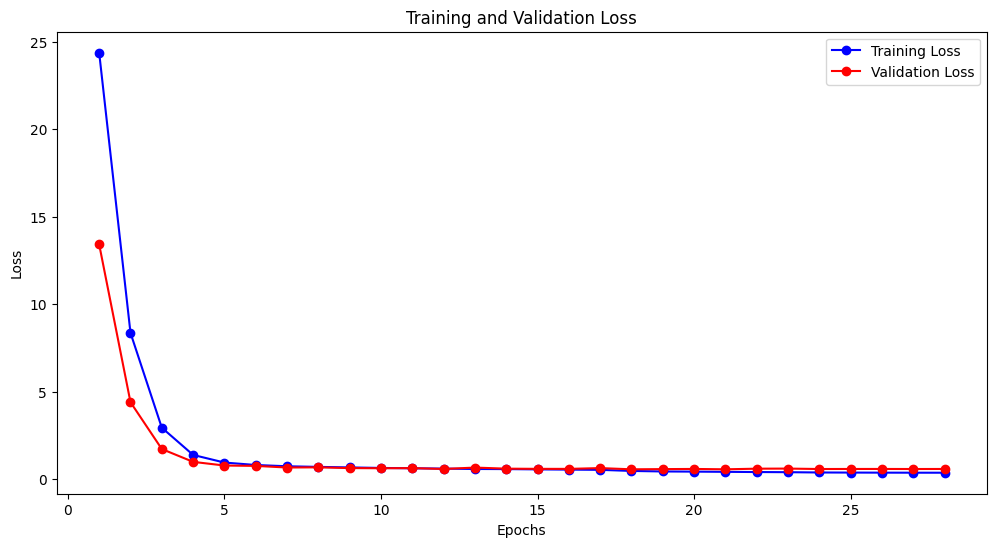

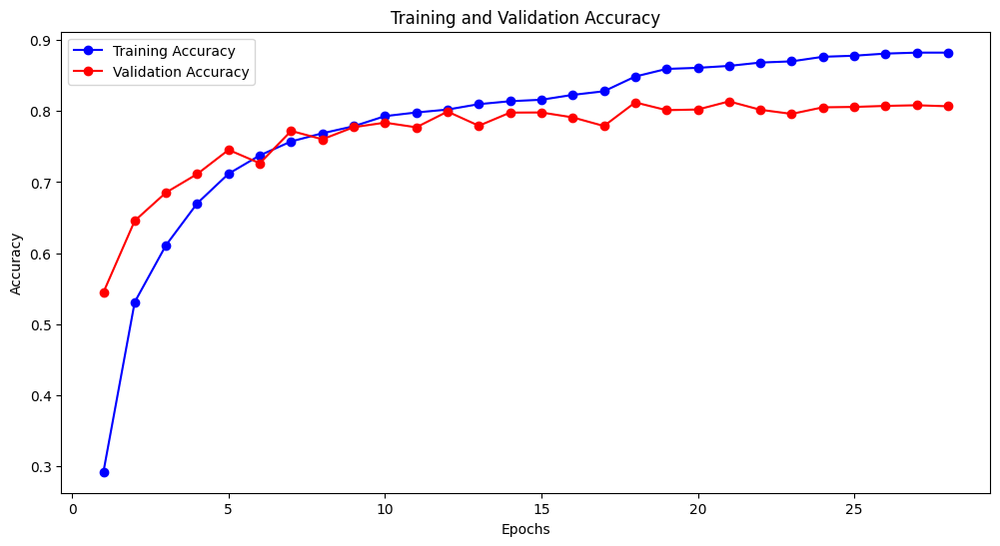

In [ ]:
import matplotlib.pyplot as plt

# Extract history data
train_loss = history.history['loss']
val_loss = history.history['val_loss']
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(1, len(train_loss) + 1)  # Number of epochs

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.plot(epochs, train_loss, 'bo-', label='Training Loss')  # Blue dots
plt.plot(epochs, val_loss, 'ro-', label='Validation Loss')  # Red dots
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.plot(epochs, train_acc, 'bo-', label='Training Accuracy')
plt.plot(epochs, val_acc, 'ro-', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

Found 3197 images belonging to 14 classes.
50/50 [==============================] - 16s 303ms/step
Classification Report
                   precision    recall  f1-score   support

   Abnormal-ELBOW       0.88      0.74      0.80       230
  Abnormal-FINGER       0.88      0.65      0.75       247
 Abnormal-FOREARM       0.86      0.58      0.70       151
    Abnormal-HAND       0.86      0.42      0.56       189
 Abnormal-HUMERUS       0.86      0.79      0.83       140
Abnormal-SHOULDER       0.73      0.83      0.78       278
   Abnormal-WRIST       0.91      0.71      0.79       295
     Normal-ELBOW       0.75      0.93      0.83       235
    Normal-FINGER       0.69      0.88      0.78       214
   Normal-FOREARM       0.74      0.80      0.77       150
      Normal-HAND       0.70      0.96      0.81       271
   Normal-HUMERUS       0.83      0.85      0.84       148
  Normal-SHOULDER       0.80      0.73      0.76       285
     Normal-WRIST       0.78      0.95      0.86    

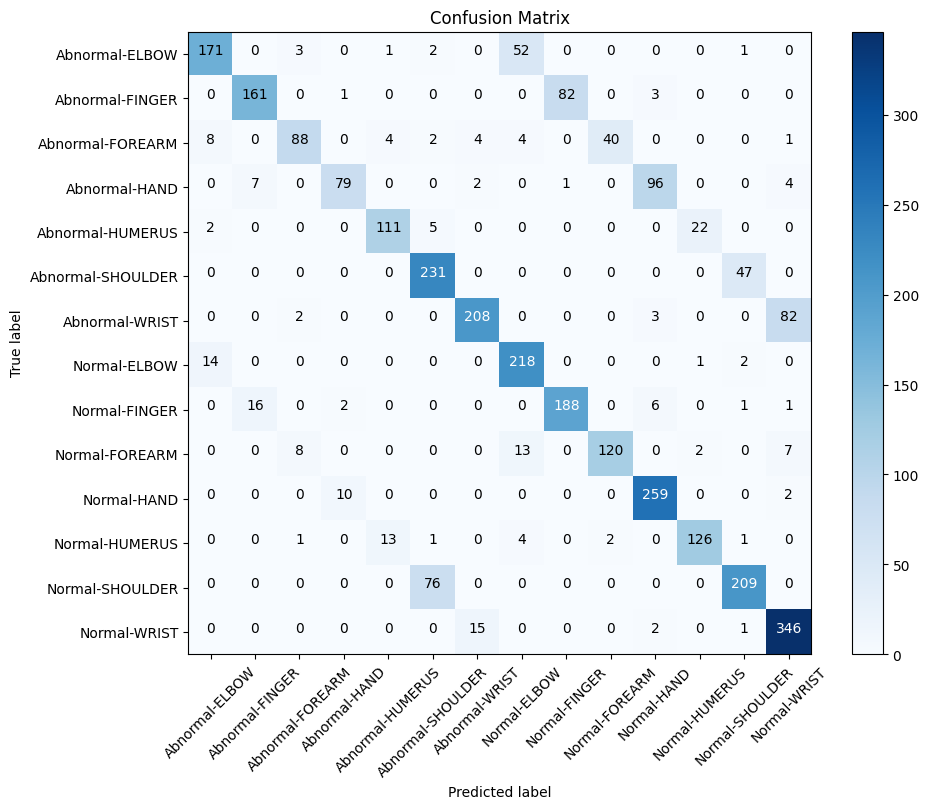

In [ ]:
from tensorflow.keras.models import load_model
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import itertools
import matplotlib.pyplot as plt

# Load the saved model
model = load_model('attention_heads3_dropout_denseblock_3.keras')

test_datagen = ImageDataGenerator(rescale=1./255)

# Ensure the generator is not shuffling data to match predictions with their true labels
test_generator = test_datagen.flow_from_directory(
    'multiclass_test',
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical',
    shuffle=False  # Important for correct label matching
)

# Number of images in the test set
num_of_test_samples = test_generator.samples

# Predicting the whole test set
test_generator.reset()  # Resetting generator to ensure proper label ordering
predictions = model.predict(test_generator, steps=np.ceil(num_of_test_samples / 64))

# Convert predictions to one hot vectors
y_pred = np.argmax(predictions, axis=1)

# True labels
y_true = test_generator.classes

# Class labels
class_labels = list(test_generator.class_indices.keys())

# Classification report
print('Classification Report')
report = classification_report(y_true, y_pred, target_names=class_labels)
print(report)

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Plotting non-normalized confusion matrix
plt.figure(figsize=(10, 8))
plot_confusion_matrix(cm, classes=class_labels, title='Confusion Matrix')
plt.show()

In [ ]:
import math

# Predicting the whole test set
test_generator.reset()  # Resetting generator to ensure proper label ordering
steps = math.ceil(num_of_test_samples / 64)
predictions = model.predict(test_generator, steps=steps)

50/50 [==============================] - 12s 230ms/step


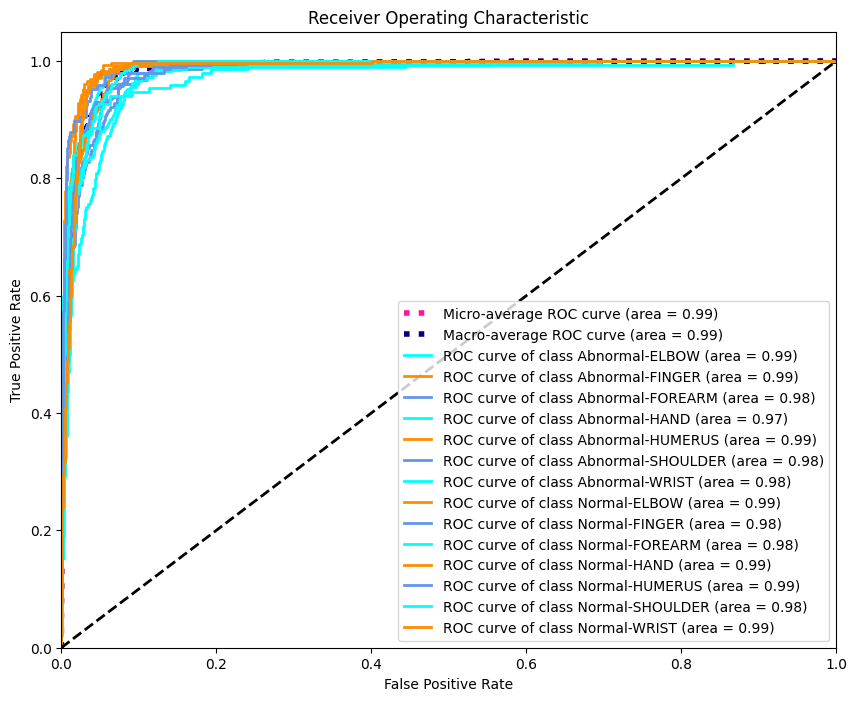

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# Number of classes
n_classes = len(class_labels)

# Binarize the output labels for each class
y_test_bin = label_binarize(y_true, classes=np.arange(n_classes))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), predictions.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Compute macro-average ROC curve and ROC area
# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"], tpr["macro"], _ = roc_curve(y_test_bin.ravel(), predictions.ravel())
roc_auc["macro"] = auc(all_fpr, mean_tpr)

# Plot all ROC curves
plt.figure(figsize=(10, 8))
plt.plot(fpr["micro"], tpr["micro"],
         label='Micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='Macro-average ROC curve (area = {0:0.2f})'.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label='ROC curve of class {0} (area = {1:0.2f})'.format(class_labels[i], roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

/tmp/ipykernel_49749/4124132773.py:59: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "r--" (-> linestyle='--'). The keyword argument will take precedence.
  plt.plot(fpr["micro"], tpr["micro"], 'r--',
/tmp/ipykernel_49749/4124132773.py:59: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--" (-> color='r'). The keyword argument will take precedence.
  plt.plot(fpr["micro"], tpr["micro"], 'r--',
/tmp/ipykernel_49749/4124132773.py:63: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "b--" (-> linestyle='--'). The keyword argument will take precedence.
  plt.plot(fpr["macro"], tpr["macro"], 'b--',
/tmp/ipykernel_49749/4124132773.py:63: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b--" (-> color='b'). The keyword argument will take precedence.
  plt.plot(fpr["macro"], tpr["macro"], 'b--',


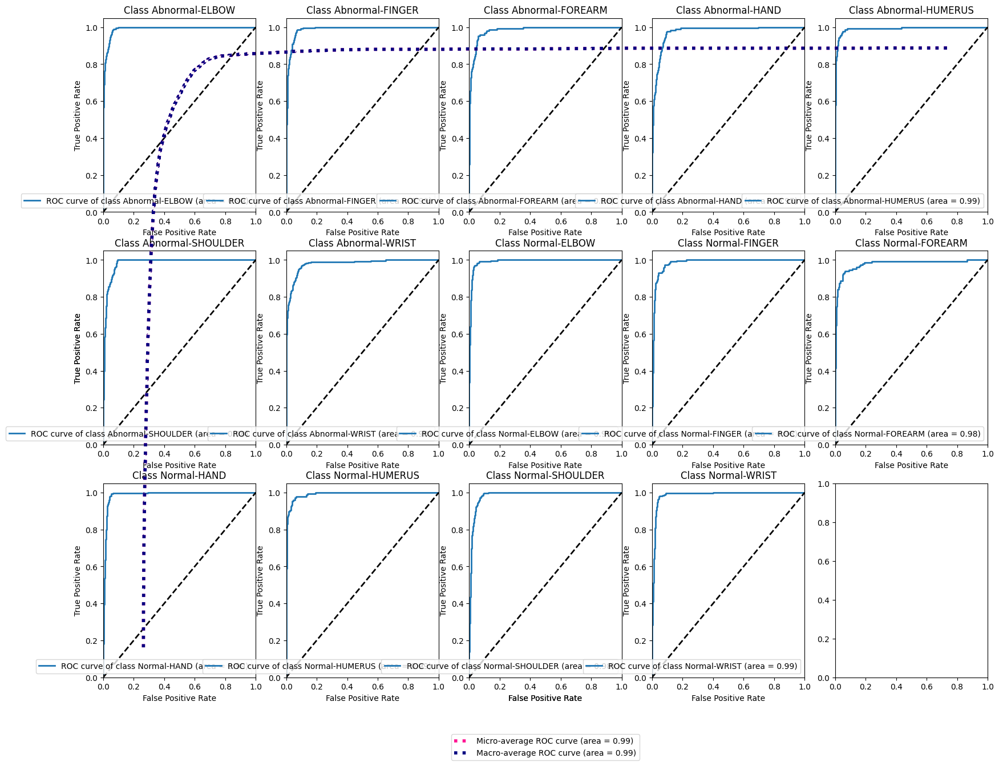

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle

# Number of classes
n_classes = len(class_labels)

# Binarize the output labels for each class
y_test_bin = label_binarize(y_true, classes=np.arange(n_classes))

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], predictions[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), predictions.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Compute macro-average ROC curve and ROC area
# Aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes
fpr["macro"], tpr["macro"], _ = roc_curve(y_test_bin.ravel(), predictions.ravel())
roc_auc["macro"] = auc(all_fpr, mean_tpr)

# Set up the matplotlib figure and subplots
fig, axes = plt.subplots(nrows=3, ncols=int(np.ceil(n_classes / 3)), figsize=(20, 15))
axes = axes.flatten()  # Flatten axes array if multiple rows

# Plot ROC curve for each class
for i, ax in zip(range(n_classes), axes):
    ax.plot(fpr[i], tpr[i], label='ROC curve of class {0} (area = {1:0.2f})'.format(class_labels[i], roc_auc[i]), lw=2)
    ax.plot([0, 1], [0, 1], 'k--', lw=2)
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title('Class {0}'.format(class_labels[i]))
    ax.legend(loc="lower right")

# Plot micro-average ROC curve
fig.add_subplot(111, frame_on=False)  # Add a big subplot for placing common X and Y labels
plt.tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.plot(fpr["micro"], tpr["micro"], 'r--',
         label='Micro-average ROC curve (area = {0:0.2f})'.format(roc_auc["micro"]), color='deeppink', linestyle=':', linewidth=4)

# Plot macro-average ROC curve
plt.plot(fpr["macro"], tpr["macro"], 'b--',
         label='Macro-average ROC curve (area = {0:0.2f})'.format(roc_auc["macro"]), color='navy', linestyle=':', linewidth=4)

plt.legend(loc="upper center", bbox_to_anchor=(0.5, -0.08))
plt.show()

2/2 [==============================] - 1s 12ms/step


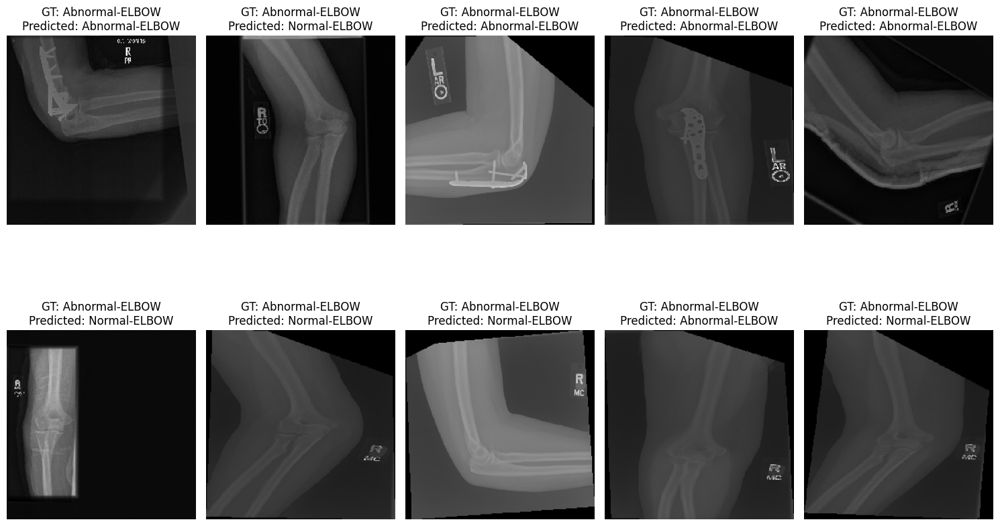

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Get the class indices and class names from the test generator
class_indices = test_generator.class_indices
classes = list(class_indices.keys())  # List of class names

# Get a batch of test images and their ground-truth labels
test_images, test_labels = test_generator[0]  # Get first batch from the test dataset
test_labels = np.argmax(test_labels, axis=1)  # Convert one-hot to class indices

# Get predictions for the test images
predictions = model.predict(test_images)
predicted_labels = np.argmax(predictions, axis=1)  # Get class indices for predictions

# Display the first 10 test images with their predicted and ground-truth classes
plt.figure(figsize=(15, 10))
for i in range(10):
    plt.subplot(2, 5, i + 1)  # Arrange in a 2x5 grid
    plt.imshow(test_images[i])  # Display the image
    plt.axis('off')  # Hide axis
    # Display ground-truth and predicted classes
    plt.title(f"GT: {classes[test_labels[i]]}\nPredicted: {classes[predicted_labels[i]]}")

plt.tight_layout()  # Adjust layout for better spacing
plt.show()

In [ ]:
from tensorflow.keras.models import Model

# Load the pre-trained model
model = load_model('attention_heads3_dropout_denseblock_3.keras')

# Assuming attention layers are named 'attention_0', 'attention_1', 'attention_2'
attention_layer_names = ['attention_0', 'attention_1', 'attention_2']
attention_outputs = [model.get_layer(name).output for name in attention_layer_names]

# Modify the model to output both the final predictions and the attention maps
model_attention_maps = Model(inputs=model.input, outputs=[model.output] + attention_outputs)

## Visualizing Attention Maps

2/2 [==============================] - 1s 281ms/step


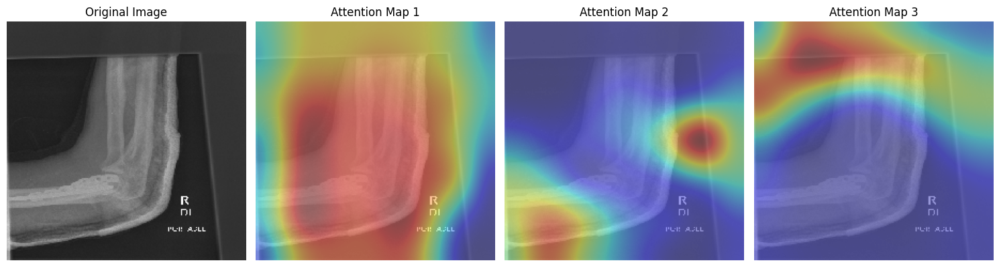

In [ ]:
import matplotlib.pyplot as plt

# Get test images and predictions
test_images, _ = test_generator.next()  # Load a batch of images
predictions, *attention_maps = model_attention_maps.predict(test_images)  # Get predictions and attention maps

# Select an image index to visualize
img_index = 0

plt.figure(figsize=(15, 5))
plt.subplot(1, 4, 1)
plt.imshow(test_images[img_index])
plt.title("Original Image")
plt.axis('off')

# Loop through each attention map
for i, attention_map in enumerate(attention_maps):
    plt.subplot(1, 4, i+2)
    # Resize attention map to match the image size
    resized_attention_map = zoom(attention_map[img_index, :, :, 0], (test_images.shape[1] / attention_map.shape[1], test_images.shape[2] / attention_map.shape[2]))
    plt.imshow(test_images[img_index], alpha=0.6)
    plt.imshow(resized_attention_map, cmap='jet', alpha=0.4)
    plt.title(f"Attention Map {i+1}")
    plt.axis('off')

plt.tight_layout()
plt.show()

2/2 [==============================] - 0s 150ms/step


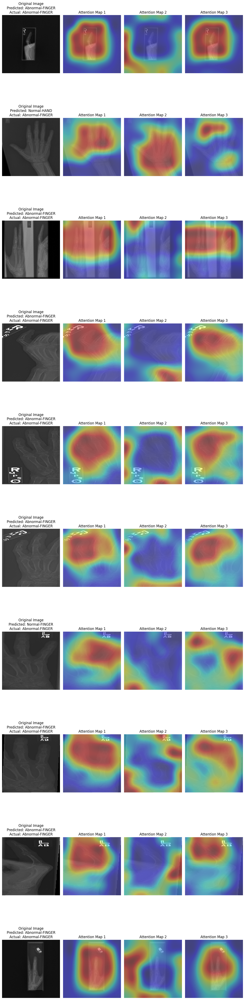

In [ ]:
import matplotlib.pyplot as plt
from scipy.ndimage import zoom
import numpy as np

# Get a batch of test images and their labels
test_images, test_labels = test_generator.next()  # Load a batch of images and labels

# Get predictions and attention maps
predictions, *attention_maps = model_attention_maps.predict(test_images)

# Convert class indices keys to a list for indexing
class_labels = list(test_generator.class_indices.keys())

# Number of images to display
num_images = 10

plt.figure(figsize=(15, num_images * 5))  # Adjust figure size appropriately

for j in range(num_images):
    img_index = j  # Image index in the batch

    # Get the predicted and actual labels
    predicted_label = np.argmax(predictions[img_index])
    actual_label = np.argmax(test_labels[img_index])
    predicted_class = class_labels[predicted_label]
    actual_class = class_labels[actual_label]

    # Original image
    plt.subplot(num_images, 5, j * 5 + 1)
    plt.imshow(test_images[img_index])
    plt.title(f"Original Image\nPredicted: {predicted_class}\nActual: {actual_class}")
    plt.axis('off')

    # Loop through each attention map
    for i, attention_map in enumerate(attention_maps):
        plt.subplot(num_images, 5, j * 5 + i + 2)
        # Resize attention map to match the image size
        resized_attention_map = zoom(attention_map[img_index, :, :, 0], (test_images.shape[1] / attention_map.shape[1], test_images.shape[2] / attention_map.shape[2]))
        plt.imshow(test_images[img_index], alpha=0.6)
        plt.imshow(resized_attention_map, cmap='jet', alpha=0.4)
        plt.title(f"Attention Map {i+1}")
        plt.axis('off')

plt.tight_layout()
plt.show()

## Saliency Maps using Keras Visualizer

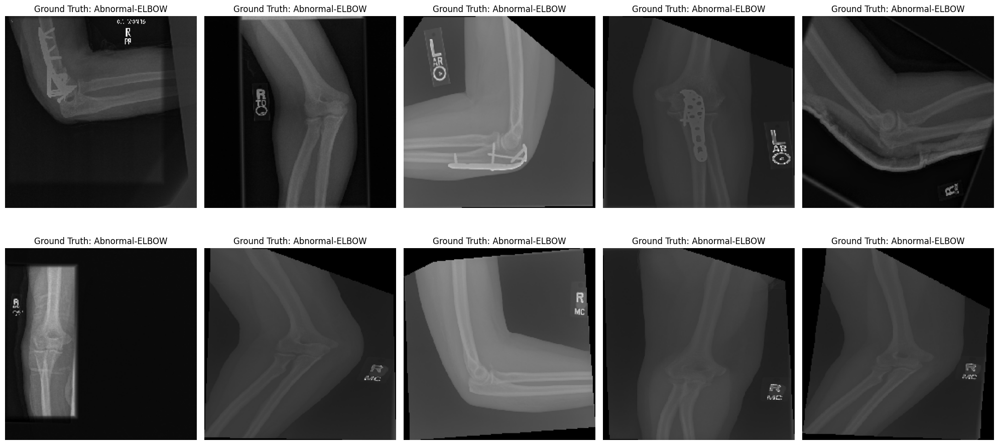

2/2 [==============================] - 0s 241ms/step


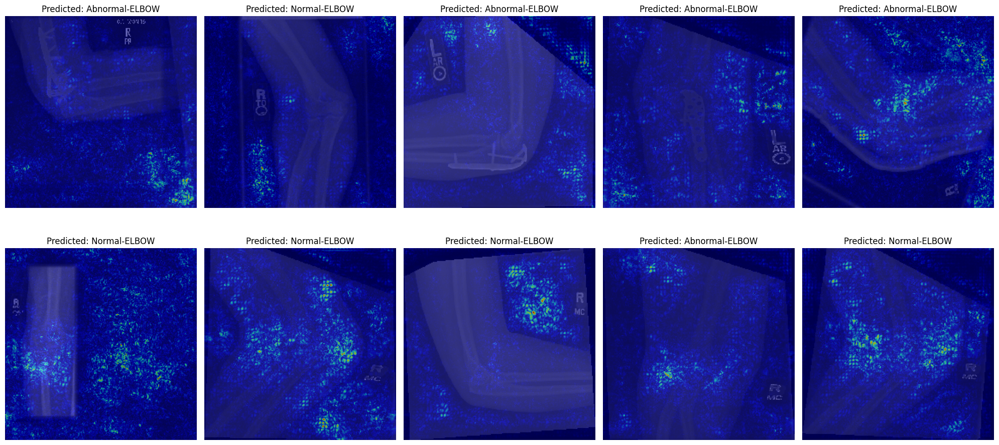

In [ ]:
from tf_keras_vis.saliency import Saliency
from tf_keras_vis.utils.model_modifiers import ExtractIntermediateLayer
from tf_keras_vis.utils.scores import CategoricalScore
import matplotlib.pyplot as plt
import numpy as np

# Select the layer to visualize for saliency maps
layer_name = 'conv5_block16_2_conv'  # Change to your chosen layer
extractor = ExtractIntermediateLayer(layer_name)
saliency = Saliency(model, model_modifier=extractor)

# Get the class names from the test generator
class_indices = test_generator.class_indices
classes = list(class_indices.keys())  # List of class names

# Get a batch of test images for visualization
test_images, test_labels = test_generator[0]  # Load a batch from test data

# Visualize original test images along with their ground truth labels
plt.figure(figsize=(20, 10))  # Create a larger figure for better visualization
for i in range(10):  # Iterate over the first 10 test images
    plt.subplot(2, 5, i + 1)  # Create a 2x5 grid for the images

    # Display the original image with its ground truth label
    plt.imshow(test_images[i])  # Original image
    ground_truth_label = classes[np.argmax(test_labels[i])]  # Get ground truth class name
    plt.title(f'Ground Truth: {ground_truth_label}')  # Add ground truth class to title
    plt.axis('off')  # Hide axis for better visualization

plt.tight_layout()  # Adjust layout for better spacing
plt.show()  # Display the visualization

# Predict class labels for the test images
predictions = model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)  # Get predicted class indices

# Visualize attention maps for the same set of images
plt.figure(figsize=(20, 10))  # Create a larger figure for better visualization
for i in range(10):  # Iterate over the first 10 test images
    plt.subplot(2, 5, i + 1)  # Create a 2x5 grid for the images

    # Compute the saliency (attention) map for the current image
    score = CategoricalScore([predicted_classes[i]])  # Score for predicted class
    saliency_map = saliency(score, test_images[i][np.newaxis, ...])

    # Display the attention map
    plt.imshow(test_images[i])  # Original image
    plt.imshow(saliency_map[0], cmap='jet', alpha=0.6)  # Attention map overlay
    predicted_label = classes[predicted_classes[i]]  # Get predicted class name
    plt.title(f'Predicted: {predicted_label}')  # Add predicted class to title
    plt.axis('off')  # Hide axis for better visualization

plt.tight_layout()  # Adjust layout for better spacing
plt.show()  # Display the visualization

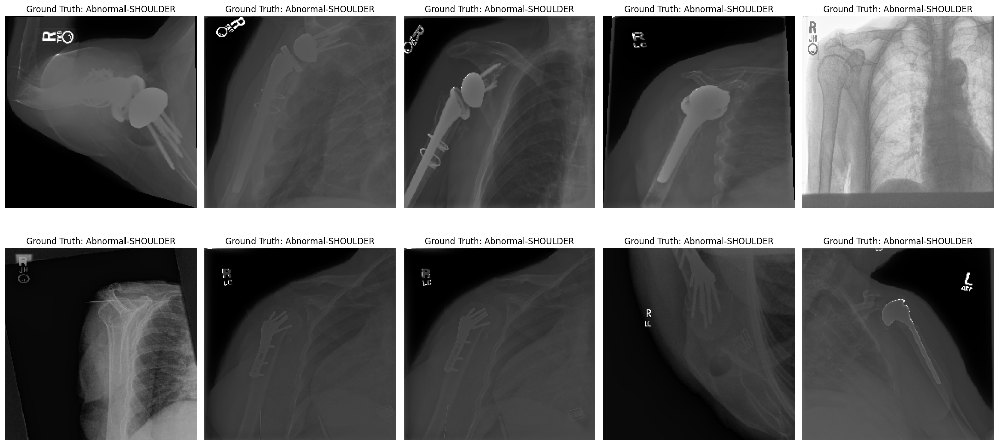

2/2 [==============================] - 0s 153ms/step


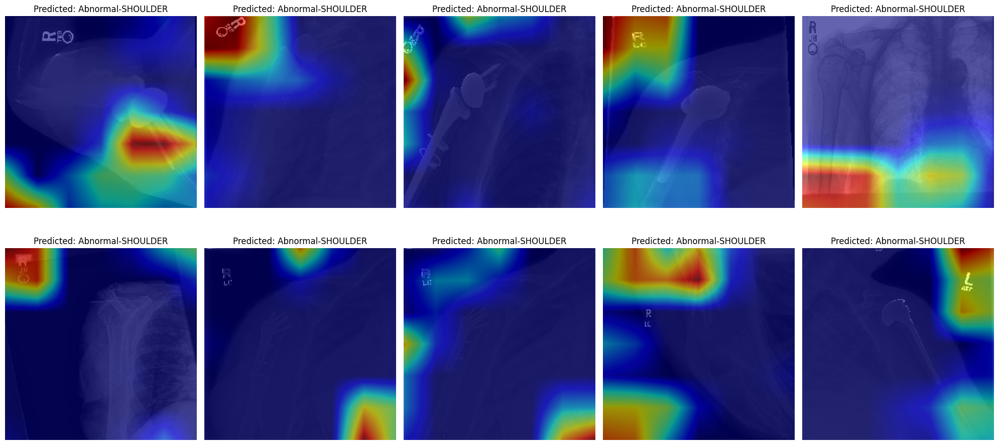

In [ ]:
from tf_keras_vis.gradcam import Gradcam
from tf_keras_vis.utils.model_modifiers import ExtractIntermediateLayer
from tf_keras_vis.utils.scores import CategoricalScore
import matplotlib.pyplot as plt
import numpy as np

# Select the layer to compute Grad-CAM
layer_name = 'conv5_block16_2_conv'  # Change to your chosen layer
extractor = ExtractIntermediateLayer(layer_name)
gradcam = Gradcam(model, model_modifier=extractor)

# Get the class names from the test generator
class_indices = test_generator.class_indices
classes = list(class_indices.keys())  # List of class names

# Get a batch of test images for visualization
test_images, test_labels = next(test_generator)  # Load a batch from test data

# Visualize original test images along with their ground truth labels
plt.figure(figsize=(20, 10))  # Create a larger figure for better visualization
for i in range(10):  # Iterate over the first 10 test images
    plt.subplot(2, 5, i + 1)  # Create a 2x5 grid for the images

    # Display the original image with its ground truth label
    plt.imshow(test_images[i])  # Original image
    ground_truth_label = classes[np.argmax(test_labels[i])]  # Get ground truth class name
    plt.title(f'Ground Truth: {ground_truth_label}')  # Add ground truth class to title
    plt.axis('off')  # Hide axis for better visualization

plt.tight_layout()  # Adjust layout for better spacing
plt.show()  # Display the visualization

# Predict class labels for the test images
predictions = model.predict(test_images)
predicted_classes = np.argmax(predictions, axis=1)  # Get predicted class indices

# Visualize Grad-CAM for the same set of images
plt.figure(figsize=(20, 10))  # Create a larger figure for better visualization
for i in range(10):  # Iterate over the first 10 test images
    plt.subplot(2, 5, i + 1)  # Create a 2x5 grid for the images

    # Compute the Grad-CAM heatmap for the current image
    score = CategoricalScore([predicted_classes[i]])  # Score for predicted class
    cam_map = gradcam(score, test_images[i][np.newaxis, ...])

    # Display the original image with the Grad-CAM heatmap
    plt.imshow(test_images[i])  # Original image
    plt.imshow(cam_map[0], cmap='jet', alpha=0.6)  # Grad-CAM heatmap overlay
    predicted_label = classes[predicted_classes[i]]  # Get predicted class name
    plt.title(f'Predicted: {predicted_label}')  # Add predicted class to title
    plt.axis('off')  # Hide axis for better visualization

plt.tight_layout()  # Adjust layout for better spacing
plt.show()  # Display the visualization

# **Cohen Kappa Statistic**

In [ ]:
from tensorflow.keras.models import load_model
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, cohen_kappa_score
import itertools
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Load the saved model
model = load_model('attention_heads3_dropout_denseblock_3.keras')

test_datagen = ImageDataGenerator(rescale=1./255)

# Ensure the generator is not shuffling data to match predictions with their true labels
test_generator = test_datagen.flow_from_directory(
    'multiclass_test',
    target_size=(224, 224),
    batch_size=64,
    class_mode='categorical',
    shuffle=False  # Important for correct label matching
)

# Number of images in the test set
num_of_test_samples = test_generator.samples

# Predicting the whole test set
test_generator.reset()  # Resetting generator to ensure proper label ordering
predictions = model.predict(test_generator, steps=np.ceil(num_of_test_samples / 64))

# Convert predictions to one hot vectors
y_pred = np.argmax(predictions, axis=1)

# True labels
y_true = test_generator.classes

# Class labels
class_labels = list(test_generator.class_indices.keys())

# Calculate and print the Cohen Kappa statistic
kappa = cohen_kappa_score(y_true, y_pred)
print(f'Cohen Kappa Score: {kappa:.4f}')